# Research Question 1

## CSV dataset cleaning
This research commenced with a total of 1107 raw data entries. Recognizing that the original data contained numerous sets that were not pertinent to the present study, as well as a substantial quantity of missing values, a preliminary data cleaning process was undertaken. This process, performed in Excel, primarily involved the elimination of unnecessary information. To ensure data consistency across the study, only those entries with comprehensive responses to all fields required by this research were selected. Following this meticulous data curation process, the study was left with 111 data entries for e-scooter users and 207 for non-e-scooter users.

## Import library

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import random
import folium
import geopandas as gpd
import seaborn as sns
import numpy as np
import textwrap
import plotly.express as px
from textwrap import wrap

## Read dataset

In [2]:
user = pd.read_csv('Data_Survey_user.csv')
nonuser = pd.read_csv('Data_Survey_non-user.csv')
mix = pd.read_csv('Data_Survey_mix.csv')

## Step 1: EDA

In [3]:
def add_line_breaks(label, characters_per_line):
    words = label.split(' ')
    lines = ['']
    line_index = 0
    for word in words:
        if len(lines[line_index] + word) > characters_per_line:
            lines.append(word)
            line_index += 1
        else:
            if lines[line_index] != '':
                lines[line_index] += ' '
            lines[line_index] += word
    return '\n'.join(lines)

def plot_histogram(data, column, title, fontsize=14):
    # Count the frequency of each unique value in the column
    counts = data[column].value_counts(normalize=True) * 100  # Convert to percentages

    # If any label is longer than 20 characters, add line breaks
    max_label_length = max(len(str(x)) for x in counts.index)
    if max_label_length > 20:
        counts.index = [add_line_breaks(str(x), 20) for x in counts.index]

    # Generate a vertical bar plot
    plt.figure(figsize=(10, 6))
    bars = plt.bar(counts.index, counts.values, color='steelblue')

    # Annotate the bars with the percentage of the total count that each bar represents
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, height*1.01, f'{height:.1f}%', ha='center')

    plt.title(title, fontsize=fontsize)
    plt.ylabel('Percentage')
    plt.xticks(rotation=45, ha='right')  # Rotate the x-axis labels for better visibility
    plt.tight_layout()
    plt.show()

In [4]:
def plot_pie_chart(data, column, title, fontsize=14):
    # Count the frequency of each unique value in the column
    counts = data[column].value_counts()

    # If any label is longer than 20 characters, add line breaks
    max_label_length = max(len(str(x)) for x in counts.index)
    if max_label_length > 20:
        counts.index = [add_line_breaks(str(x), 20) for x in counts.index]

    # Generate a list of distinct colors using the 'tab20' colormap
    colors = plt.cm.tab20(range(len(counts)))

    # Generate a pie chart
    plt.figure(figsize=(10, 6))
    patches, texts, autotexts = plt.pie(counts.values, labels=counts.index, autopct='%1.1f%%', 
                                         startangle=140, colors=colors, pctdistance=0.85, 
                                         wedgeprops=dict(width=0.3))

    # Draw a circle at the center of pie to make it look like a donut
    centre_circle = plt.Circle((0,0),0.70,fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(centre_circle)

    # Equal aspect ratio ensures that pie is drawn as a circle
    plt.axis('equal')  
    
    # Increase the size of the labels to make them more visible
    for text in texts:
        text.set_fontsize(fontsize-2)
    for autotext in autotexts:
        autotext.set_fontsize(fontsize-2)

    plt.title(title, fontsize=fontsize)
    plt.tight_layout()
    plt.show()

### 1.1. EDA for user

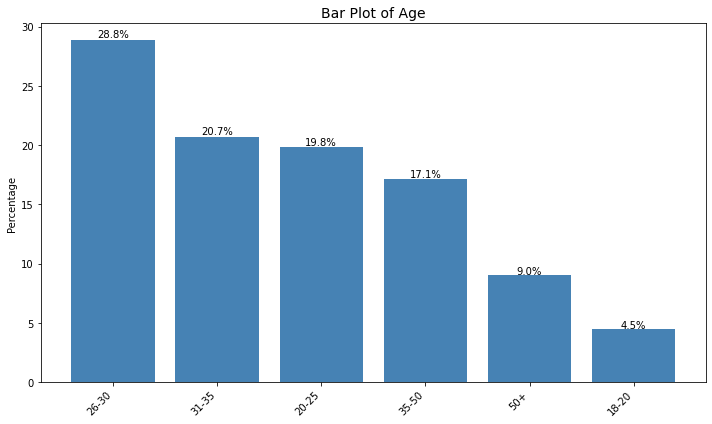

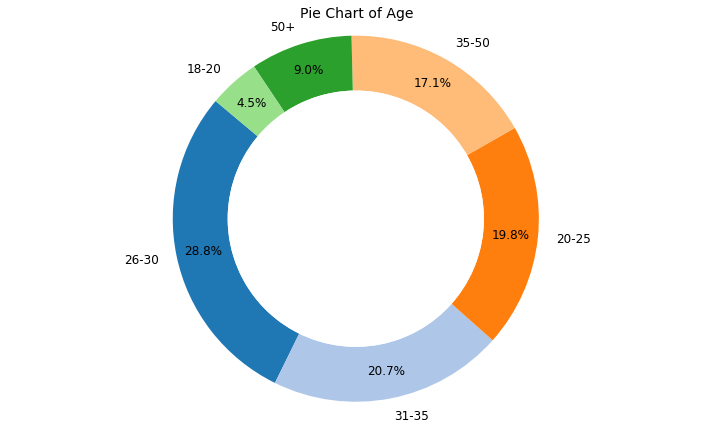

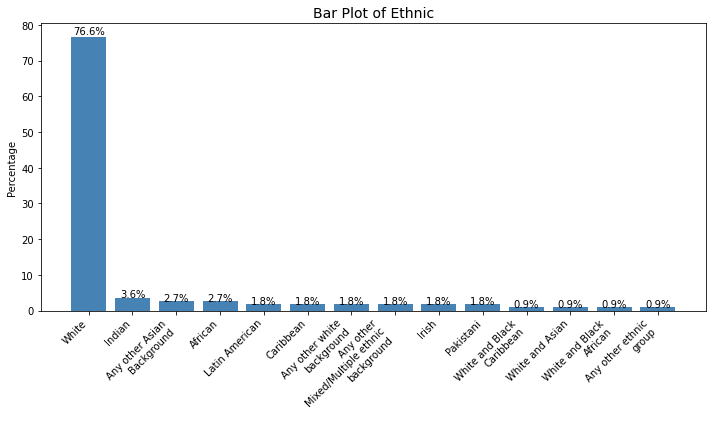

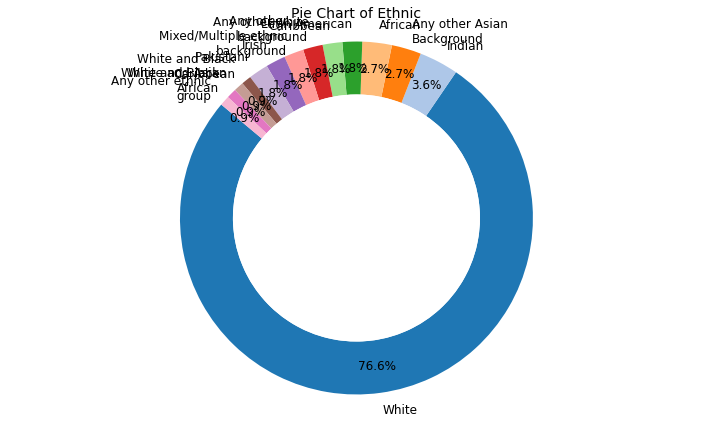

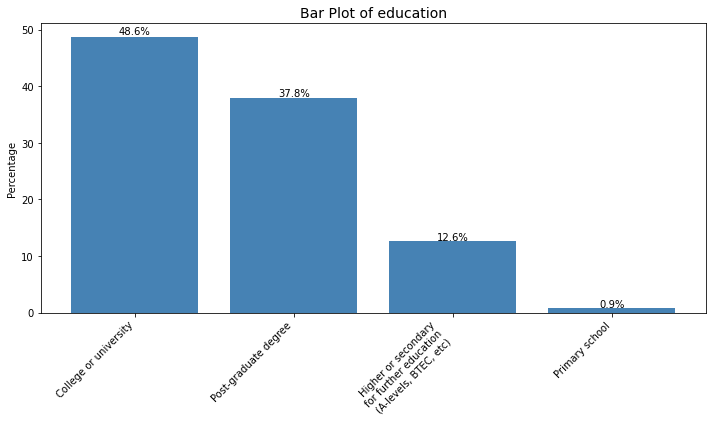

...

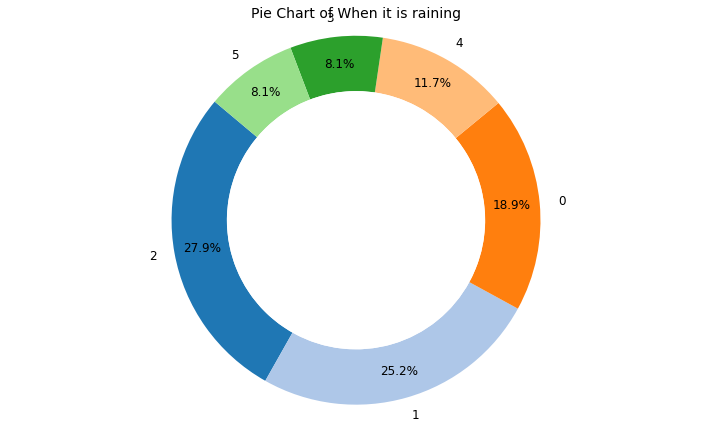

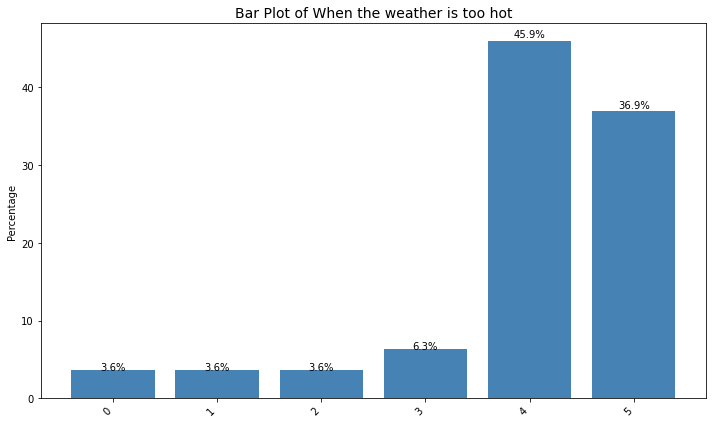

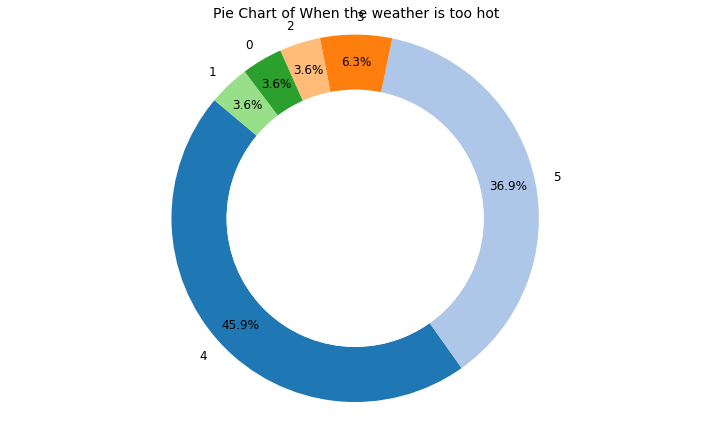

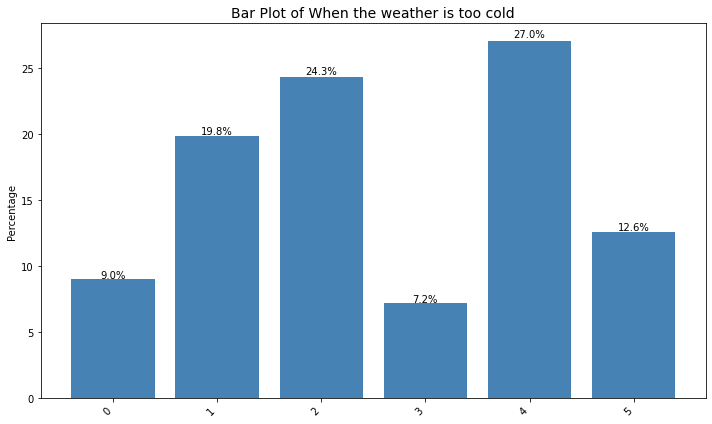

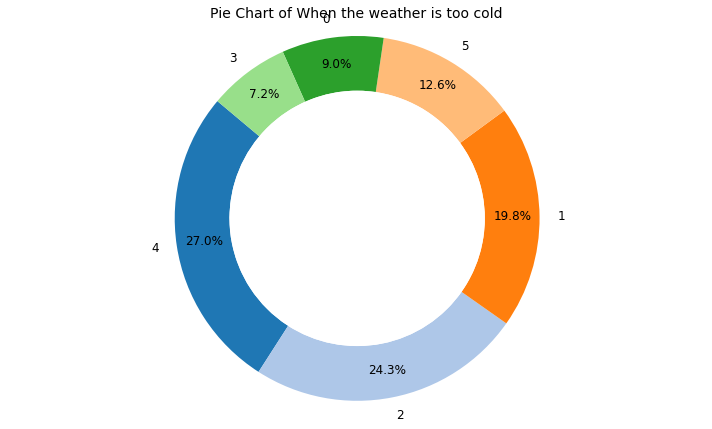

In [5]:
# Define a list of column names to exclude
exclude_list = ['Respondent ID', 'First Active', 'Gender', 'driving license', 'Disability', 'remember the last trip','weekday or weekend']

# Generate a histogram for each column in the DataFrame
for column in user.columns:
    # Skip the column if its name is in the exclude list or its data type is boolean
    if column in exclude_list:
        continue
    plot_histogram(user, column, f'Bar Plot of {column}')
    plot_pie_chart(user, column, f'Pie Chart of {column}')

### 1.2. EDA for non-user

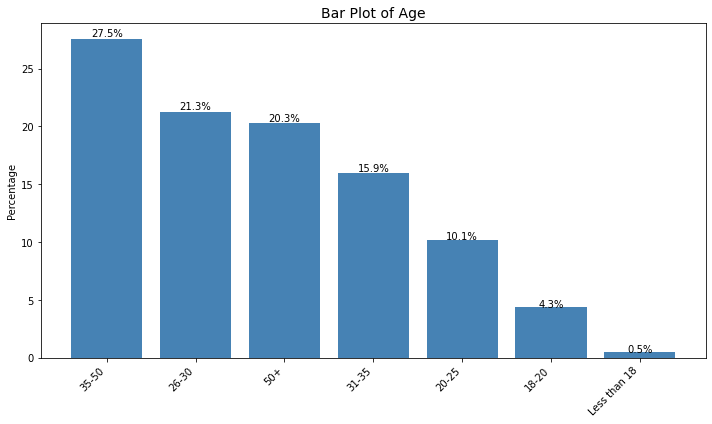

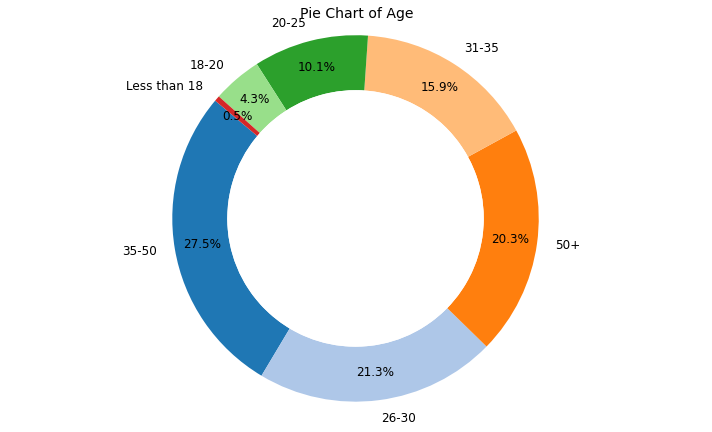

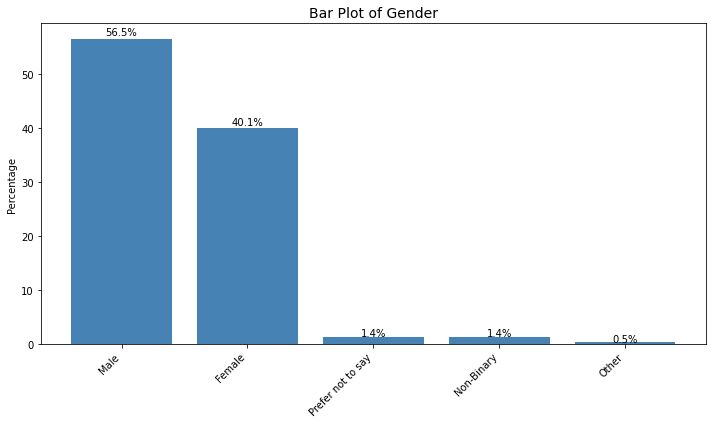

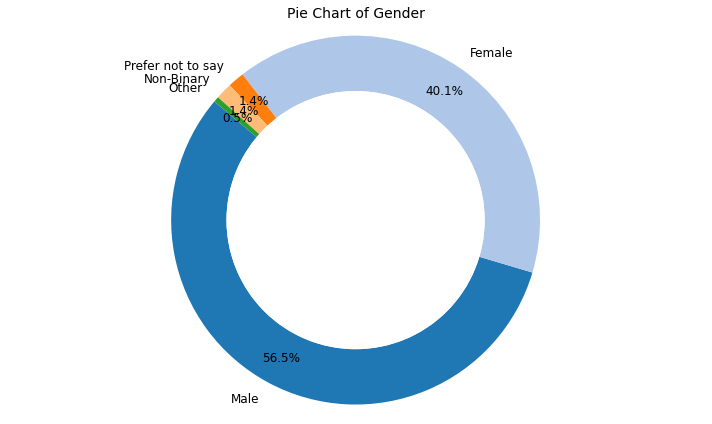

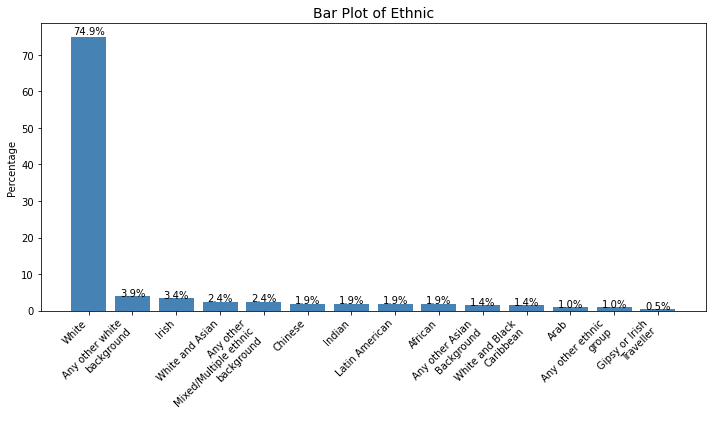

...

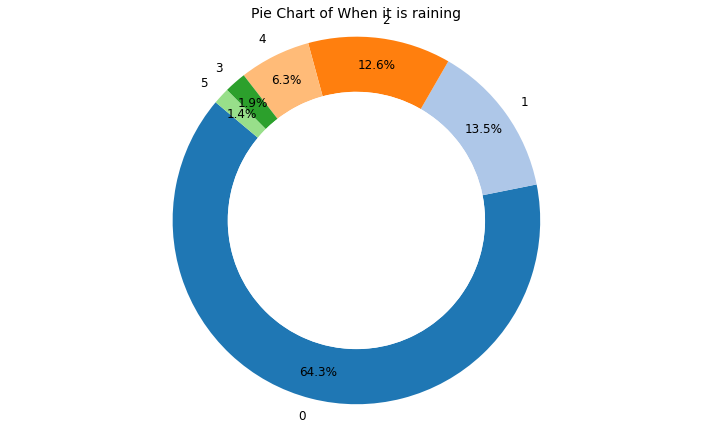

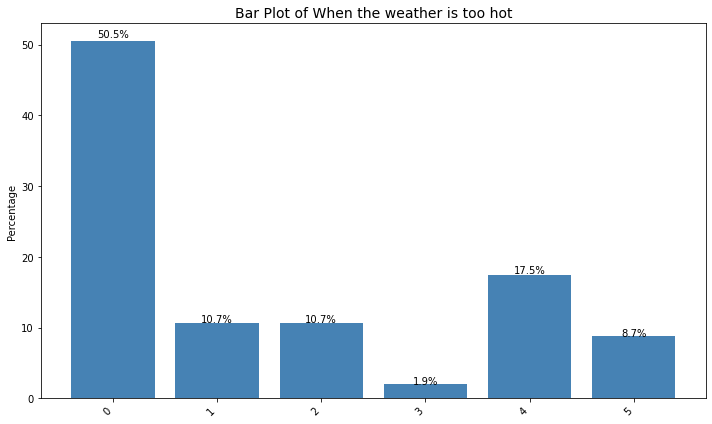

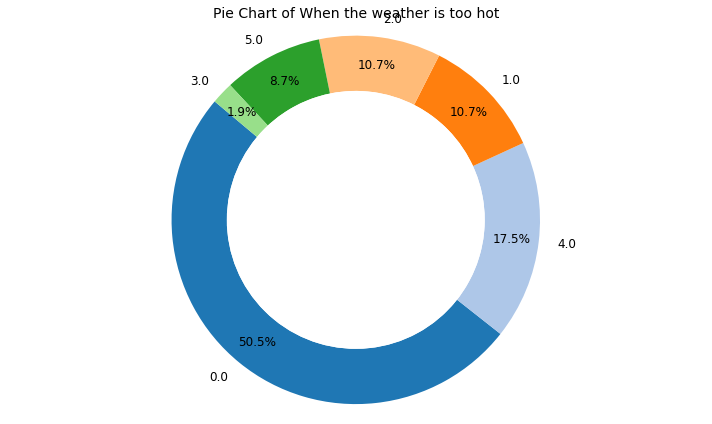

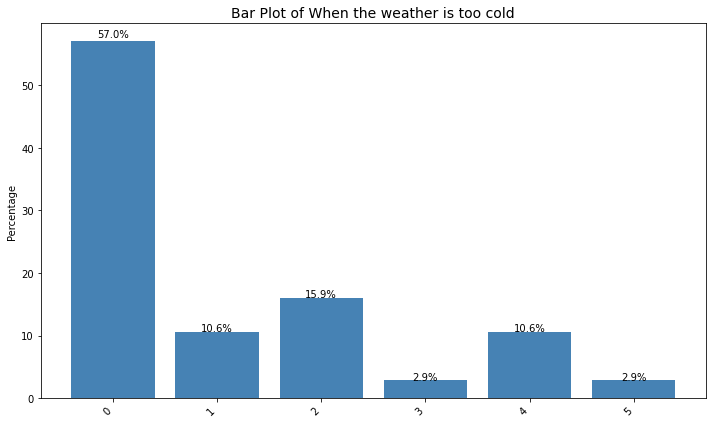

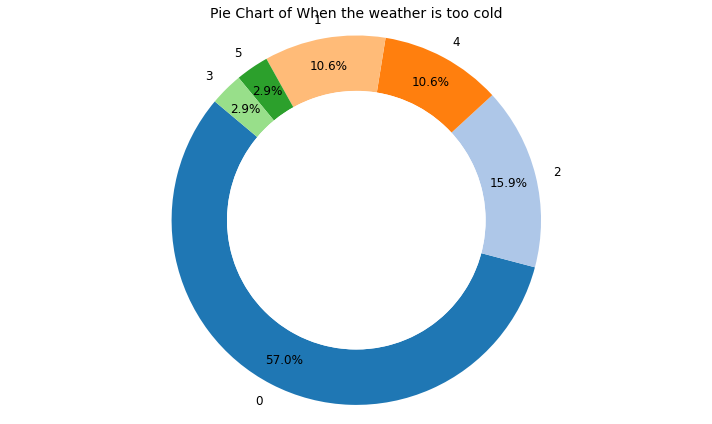

In [6]:
# Define a list of column names to exclude
exclude_list = ['Respondent ID', 'First Active', 'remember the last trip','weekday or weekend']

# Generate a histogram for each column in the DataFrame
for column in nonuser.columns:
    # Skip the column if its name is in the exclude list or its data type is boolean
    if column in exclude_list:
        continue
    plot_histogram(nonuser, column, f'Bar Plot of {column}')
    plot_pie_chart(nonuser, column, f'Pie Chart of {column}')

### 1.3. EDA for temporal component

There are two questions for the weather:

1. How much do you use the e-scooter if the weather is hot?

2. how much do you use the e-scooter if the weather is cold?

I used these two questions to determine the weather in which participants would prefer to use the shared e-scooter. If the participant assigned a higher value to hot weather than to cold weather, he preferred to use the shared e-scooter when the weather was hot. If the value of the cold weather is higher than the value of the hot weather, he prefers to use the shared e-scooter when the weather is cold. If the two values are the same, the weather is not relevant to his trip.

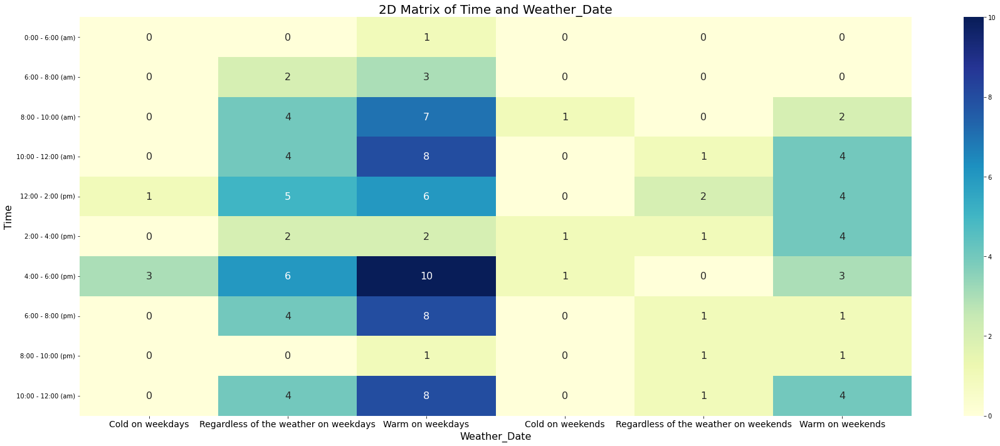

In [55]:
user['weather'] = user.apply(lambda row: 1 if row['When the weather is too cold'] > row['When the weather is too hot']
                             else 3 if row['When the weather is too hot'] > row['When the weather is too cold']
                             else 2, axis=1)

# Step 3: Extract start time and handle am/pm for intelligent time sorting
user['start_time'] = user['time'].str.extract('(\d+):').astype(int)
user.loc[user['time'].str.contains('pm') & (user['start_time'] != 12), 'start_time'] += 12
user.loc[user['time'].str.contains('0:00 - 6:00 \(am\)'), 'start_time'] = 0

# Step 4: Convert 'weekday or weekend' to 'date' column with integers
user['date'] = user['weekday or weekend'].map({'Weekday': 1, 'Weekend': 2})

# Step 5: Generate 'weather_date' based on 'date' and 'weather'
user['weather_date'] = (user['date'] - 1) * 3 + user['weather']

# Step 6: Create new labels for 'weather_date'
weather_date_labels = {
    1: 'Cold on weekdays',
    2: 'Regardless of the weather on weekdays',
    3: 'Warm on weekdays',
    4: 'Cold on weekends',
    5: 'Regardless of the weather on weekends',
    6: 'Warm on weekends'}
user['weather_date_label'] = user['weather_date'].map(weather_date_labels)

# Ensure the order of 'weather_date_label' using Categorical data type
order = ['Cold on weekdays', 'Regardless of the weather on weekdays', 'Warm on weekdays', 
         'Cold on weekends', 'Regardless of the weather on weekends', 'Warm on weekends']
user['weather_date_label'] = pd.Categorical(user['weather_date_label'], categories=order, ordered=True)

# Define the correct order for the y-axis
correct_time_order = [
    '0:00 - 6:00 (am)', '6:00 - 8:00 (am)', '8:00 - 10:00 (am)', '10:00 - 12:00 (am)',
    '12:00 - 2:00 (pm)', '2:00 - 4:00 (pm)', '4:00 - 6:00 (pm)', '6:00 - 8:00 (pm)',
    '8:00 - 10:00 (pm)', '10:00 - 12:00 (am)'
]

# Step 7: Create a 2D matrix between 'time' and 'weather_date_label'
matrix_date_weather_label = pd.crosstab(user['time'], user['weather_date_label']).reindex(correct_time_order)

# Step 8: Create the heatmap with increased figure size
fig, ax = plt.subplots(figsize=(25, 10))
sns.heatmap(matrix_date_weather_label, annot=True, fmt="d", cmap="YlGnBu", ax=ax, annot_kws={"size": 16})
ax.set_title('2D Matrix of Time and Weather_Date', fontsize=20)
ax.set_xlabel('Weather_Date', fontsize=16)
ax.set_ylabel('Time', fontsize=16)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0, horizontalalignment='center', fontsize=14)
plt.tight_layout()
plt.show()


Question: How willing are you to use the shared e-scooter in rainy days? (1-5)

If the participant's answer is greater than 3, it means that he likes to travel during rain. Participants answering less than 3 means that they do not prefer to travel during rain. If the participant answered that it was equal to 3, the rainy day would not affect his travel.

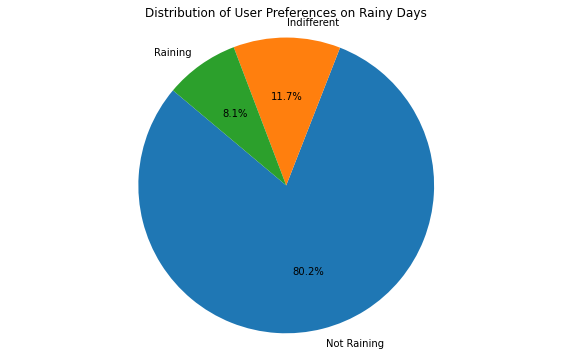

In [8]:
# Create a new column 'Rain_Category' based on the values of 'When it is raining'
user['Rain_Category'] = pd.cut(user['When it is raining'], bins=[-np.inf, 3, 4, np.inf], labels=['Not Raining', 'Indifferent', 'Raining'])

# Count the values in each category
rain_counts = user['Rain_Category'].value_counts()

# Create the pie chart
plt.figure(figsize=(10,6))
plt.pie(rain_counts, labels=rain_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of User Preferences on Rainy Days')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

### 1.4. EDA for Percentage between users and participants in different question

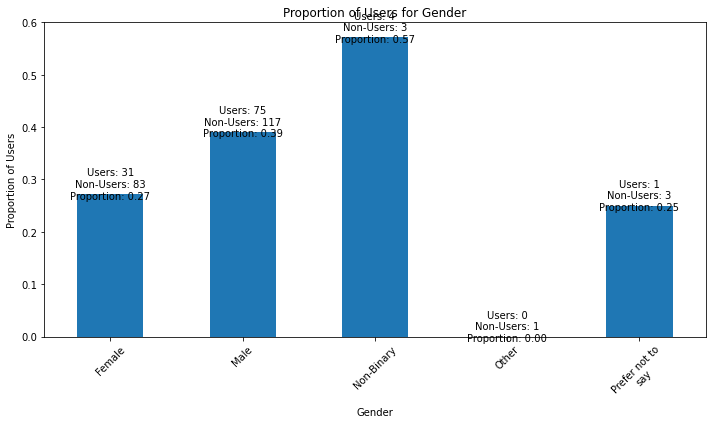

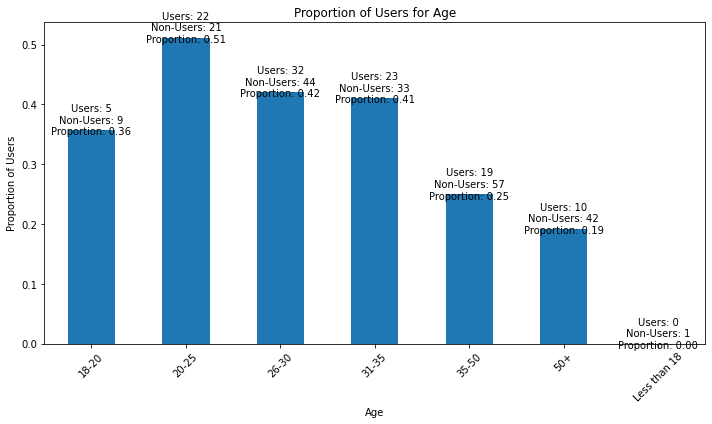

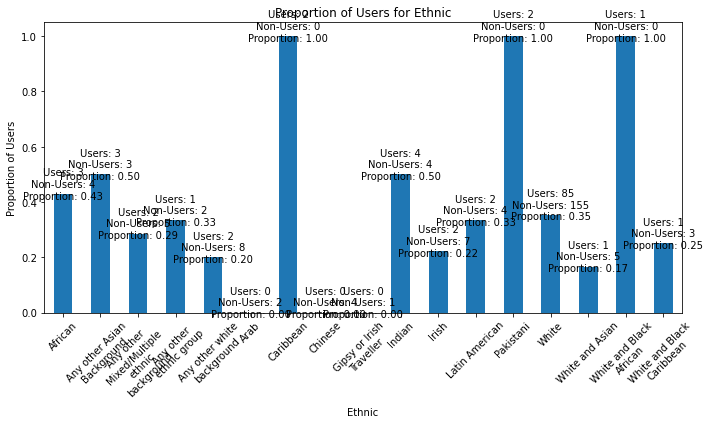

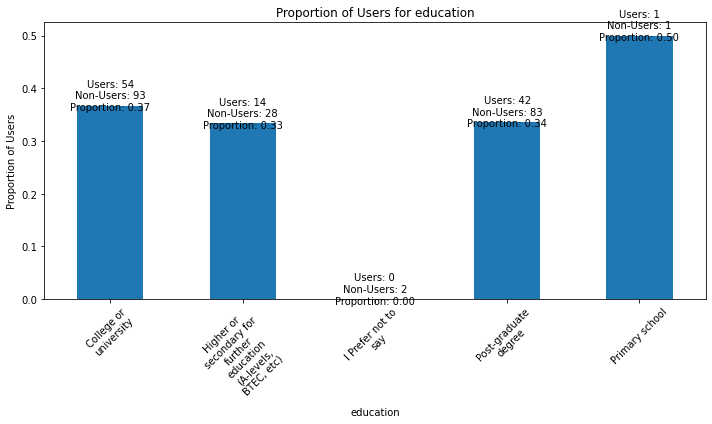

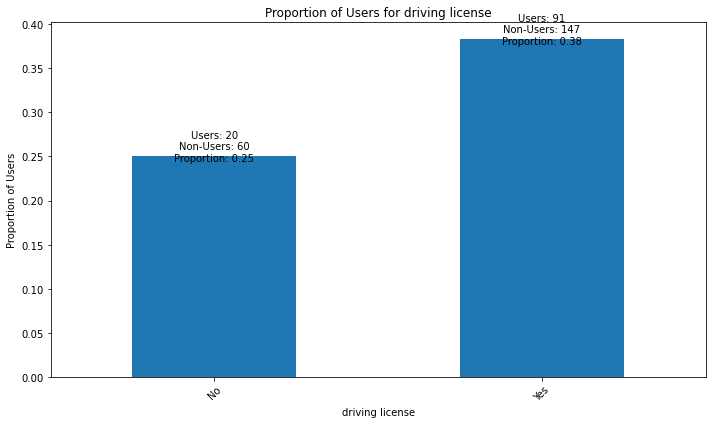

...

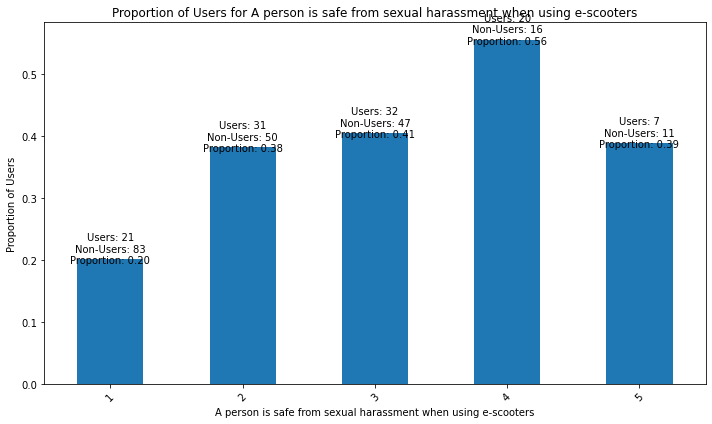

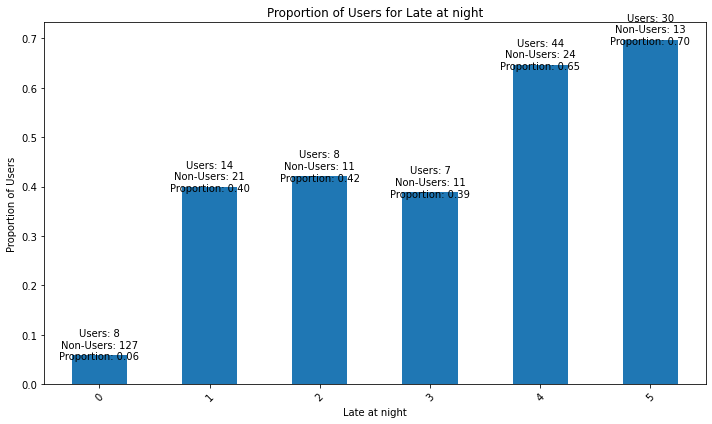

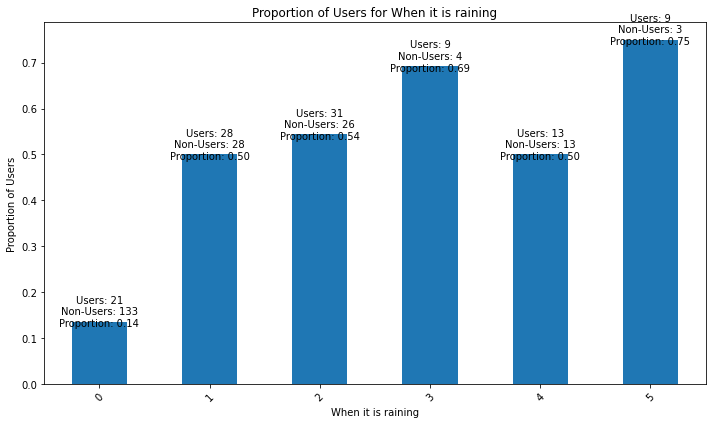

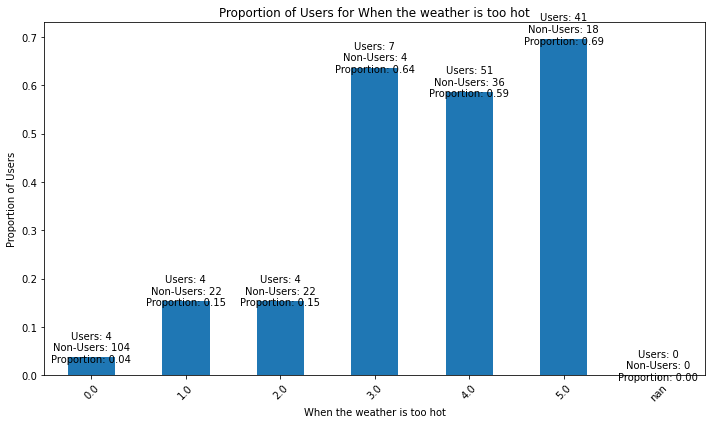

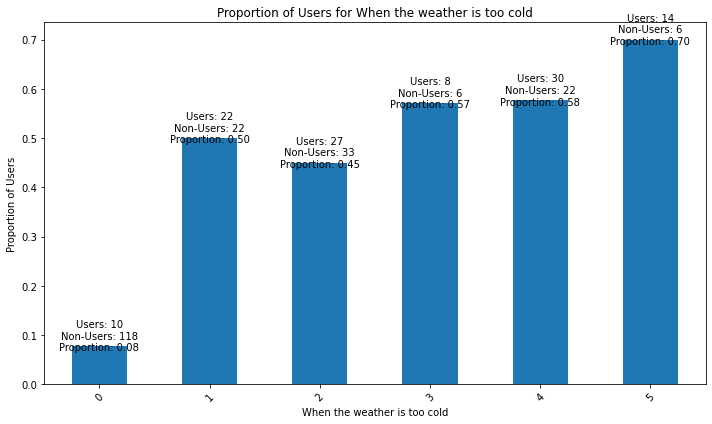

In [9]:
cols_to_analyze = ['Gender', 'Age','Ethnic', 'education', 'driving license', 'years income', 'Disability', 
                   'Space on the roads should be re-distributed to make room for e-scooters', 
                   'E-scooters are dangerous for people who use them', 
                   'E-scooters are dangerous for pedestrians', 
                   'E-scooters are dangerous for cyclists', 
                   'E-scooters are dangerous for people driving motor vehicles', 
                   'Shared e-scooter apps are too difficult to use', 
                   'Not everybody has the physical and cognitive skills to ride a e-scooter', 
                   'Riding e-scooters makes people feel free', 
                   'Riding e-scooters makes people happy', 
                   'Riding e-scooters makes people feel more independent', 
                   'Riding an e-scooter is more sustainable than using other modes of transport', 
                   'Shared e-scooters are difficult to find', 
                   'Shared e-scooters are not available in my neighbourhood', 
                   'A person is safe from crime when using e-scooters', 
                   'The design of e-scooters is not appropriate for my height or weight', 
                   'I am not sure about which road rules apply to e-scooters', 
                   'A person is safe from sexual harassment when using e-scooters', 
                   'Late at night', 'When it is raining', 'When the weather is too hot', 'When the weather is too cold']

mix['user_type'] = mix['frequent'].apply(lambda x: 'non-user' if x == 'I have never used shared e-scooters' else 'user')

def wrap_labels(text, width):
    # Use textwrap's wrap function to wrap the text
    return '\n'.join(textwrap.wrap(text, width))

for col in cols_to_analyze:
    user_counts = mix[mix['user_type'] == 'user'][col].value_counts()
    non_user_counts = mix[mix['user_type'] == 'non-user'][col].value_counts()
    total_counts = mix[col].value_counts()

    # Ensure user_counts and non_user_counts cover all categories
    all_categories = mix[col].unique()
    user_counts = user_counts.reindex(all_categories).fillna(0)
    non_user_counts = non_user_counts.reindex(all_categories).fillna(0)

    # Sort user_counts and non_user_counts to match the order of categories in the plot
    user_counts = user_counts.sort_index()
    non_user_counts = non_user_counts.sort_index()

    user_proportion = user_counts / total_counts

    # Create the bar plot with larger size
    ax = user_proportion.sort_index().plot(kind='bar', figsize=(10, 6))

    # Annotate the bars with the proportion numbers, number of users and non-users
    for i, p in enumerate(ax.patches):
        ax.annotate(f'Users: {int(user_counts.iloc[i])}\nNon-Users: {int(non_user_counts.iloc[i])}\nProportion: {p.get_height():.2f}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='center', 
                    xytext=(0, 10),  
                    textcoords='offset points')

    plt.title(f'Proportion of Users for {col}')
    plt.xlabel(col)
    plt.ylabel('Proportion of Users')

    # Apply the wrap_labels function to the xtick labels
    ax.set_xticklabels([wrap_labels(t.get_text(), 15) for t in ax.get_xticklabels()], rotation=45)

    plt.tight_layout()  # Adjust the layout to make better use of space
    plt.show()

## Step 2: find the relationship and accessibility between four components

### 2.1. land use component and individual component

In [47]:
land_ind = user[['Purpose', 'Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license','frequent']]

# Display the first few rows of the new dataframe
land_ind.head()

,Purpose,Age,Gender,years income,education,Ethnic,Disability,driving license,frequent
70,Leisure/recreation using the e-scooter (for fun),20-25,Female,"£0 - £20,000",College or university,Pakistani,No,No,More than two times per week
77,Shopping,31-35,Male,I prefer not to say,College or university,White,I prefer not to say,Yes,Occasionally (one or two times during the last...
107,Work,31-35,Female,"£60,000 - £80,000",Post-graduate degree,White,No,Yes,Once or twice per month
4,Leisure/recreation at the destination,26-30,Female,"£60,000 - £80,000",College or university,White,No,Yes,More than two times per week
33,Work,20-25,Female,"£20,000 - £40,000",College or university,White,No,Yes,More than two times per week


In [11]:
# Define a function to annotate the percentage inside each stacked bar
def annotate_stacked_bars(ax, pad=0.01, colour='black'):
    for p in ax.patches:
        value = f'{p.get_height() * 100:.1f}%'
        if p.get_height() > 0:
            ax.annotate(value, ((p.get_x() + p.get_width() / 2), p.get_y() + p.get_height() / 2), 
                        ha='center', va='center', color=colour, xytext=(0, 10), textcoords='offset points')

In [12]:
def plot_stacked_bars_counts(df, groupby_cols, colormap='viridis', title='', xlabel='', ylabel='Counts', legend_title='', legend_loc='upper left'):

    # Group the data by the columns in groupby_cols
    grouped = df.groupby(groupby_cols).size().unstack()

    # Fill NaN values with 0
    grouped = grouped.fillna(0)

    # Create the plot
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot the stacked bar chart with a pleasing colormap
    grouped.plot(kind='bar', stacked=True, ax=ax, colormap='Set3')

    # Annotate the counts inside each stacked bar
    annotate_stacked_bars(ax)

    # Set the labels and title
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    # Apply the wrap_labels function to the xtick labels and rotate them 45 degrees
    ax.set_xticklabels([wrap_labels(t.get_text(), 15) for t in ax.get_xticklabels()], rotation=45)

    # Create a new legend with wrapped labels
    handles, labels = ax.get_legend_handles_labels()
    wrapped_labels = [wrap_labels(label, 25) for label in labels]  # Wrap the labels
    ax.legend(handles, wrapped_labels, title=legend_title, bbox_to_anchor=(1.05, 1), loc=legend_loc)

    # Show the plot
    plt.tight_layout()
    plt.show()

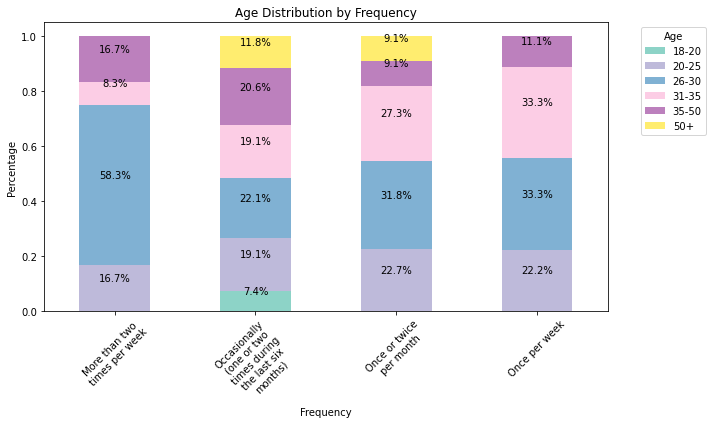

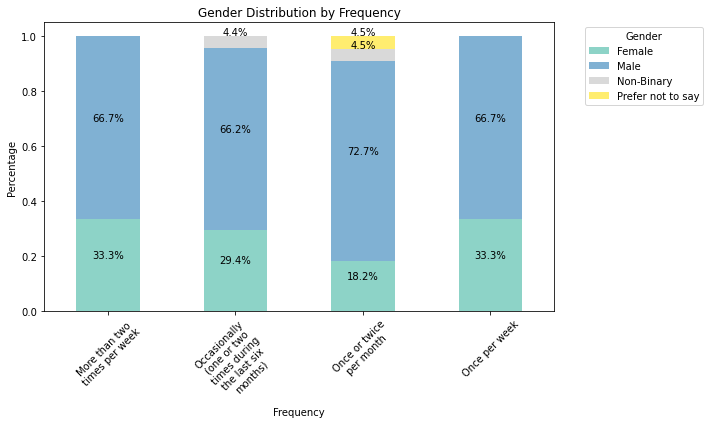

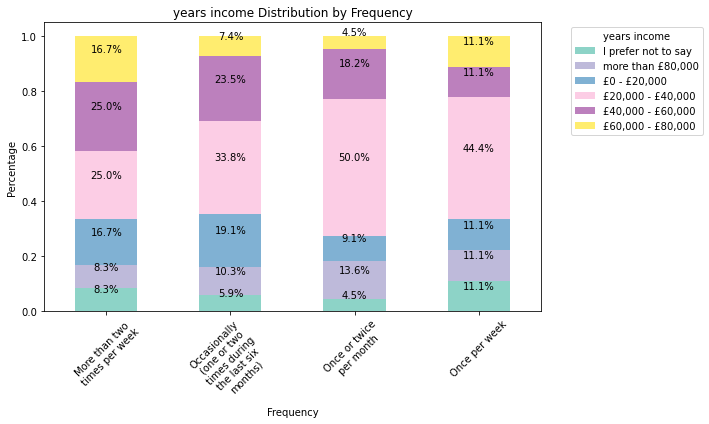

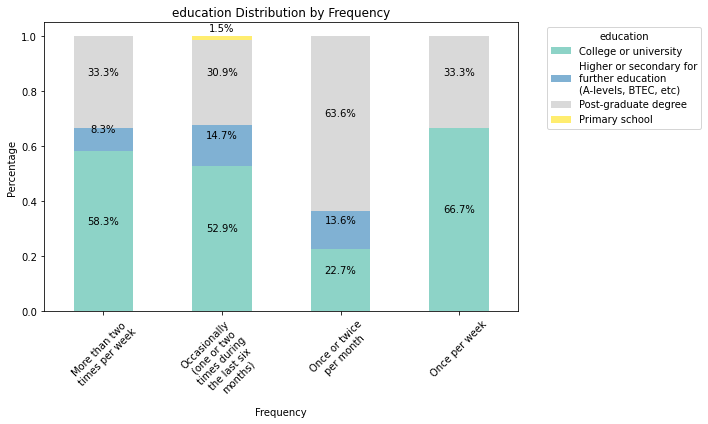

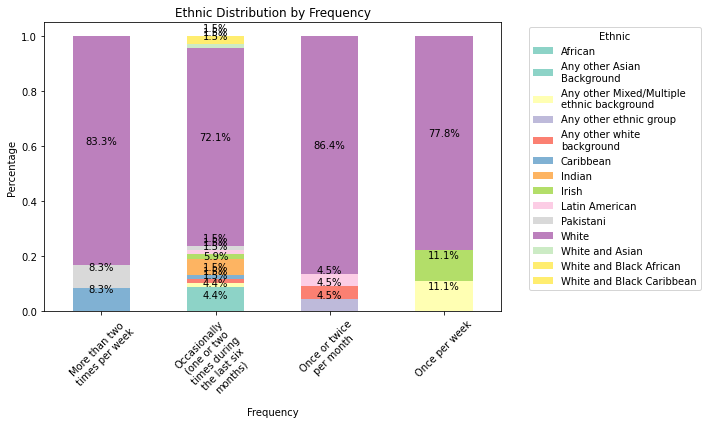

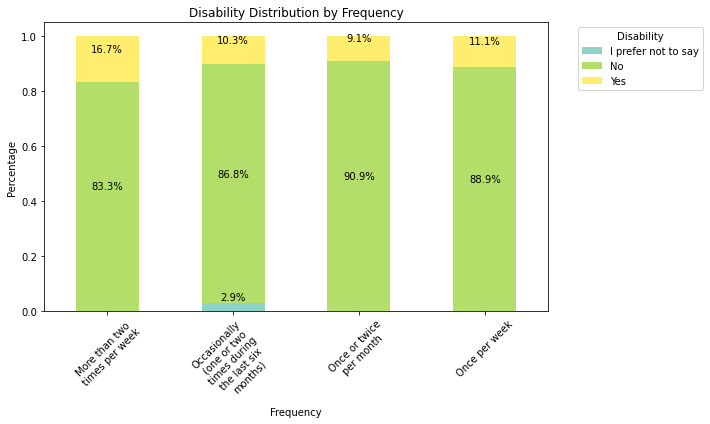

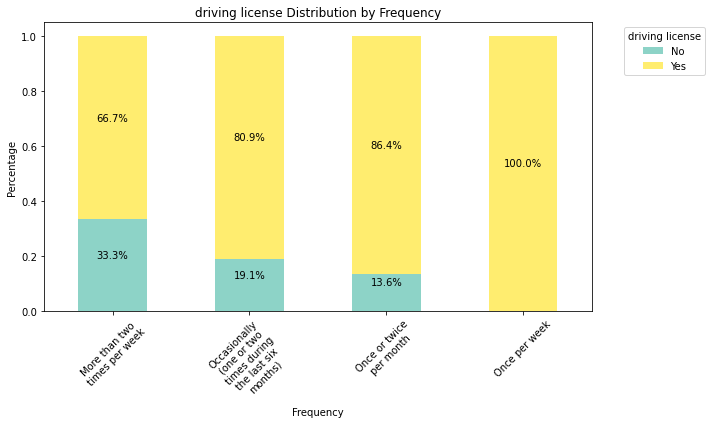

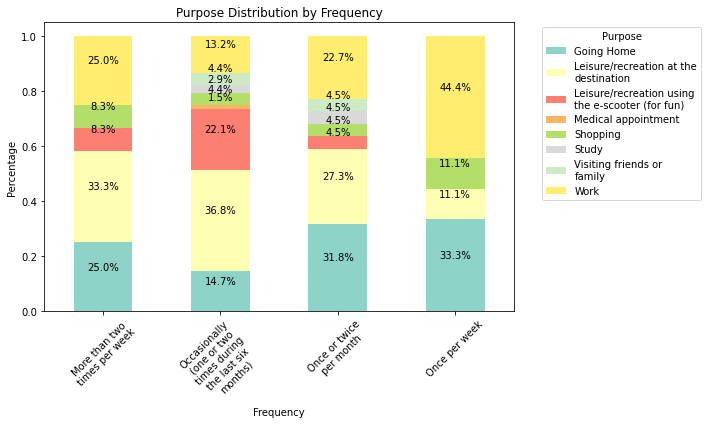

In [54]:
def wrap_labels(label, width):
    return '\n'.join(textwrap.wrap(label, width))

def plot_stacked_bars(df, groupby_cols, colormap='viridis', title='', xlabel='', ylabel='Percentage', legend_title='', legend_loc='upper left'):

    # Group the data by the columns in groupby_cols
    grouped = df.groupby(groupby_cols).size().unstack()

    # Fill NaN values with 0
    grouped = grouped.fillna(0)

    # Calculate total counts for each 'Purpose'
    total_counts = grouped.sum(axis=1)

    # Normalize grouped data by 'Purpose'
    grouped_percentage = grouped.divide(total_counts, axis=0)

    # Create the plot
    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot the stacked bar chart with a pleasing colormap
    grouped_percentage.plot(kind='bar', stacked=True, ax=ax, colormap='Set3')

    # Annotate the percentage inside each stacked bar
    annotate_stacked_bars(ax)

    # Set the labels and title
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)

    # Apply the wrap_labels function to the xtick labels and rotate them 45 degrees
    ax.set_xticklabels([wrap_labels(t.get_text(), 15) for t in ax.get_xticklabels()], rotation=45)

    # Create a new legend with wrapped labels
    handles, labels = ax.get_legend_handles_labels()
    wrapped_labels = [wrap_labels(label, 25) for label in labels]  # Wrap the labels
    ax.legend(handles, wrapped_labels, title=legend_title, bbox_to_anchor=(1.05, 1), loc=legend_loc)

    # Show the plot
    plt.tight_layout()
    plt.show()

# Create stacked bar plots for each column
cols = ['Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license','Purpose']
for col in cols:
    plot_stacked_bars(land_ind, ['frequent', col], title=f'{col} Distribution by Frequency', xlabel='Frequency', legend_title=col)


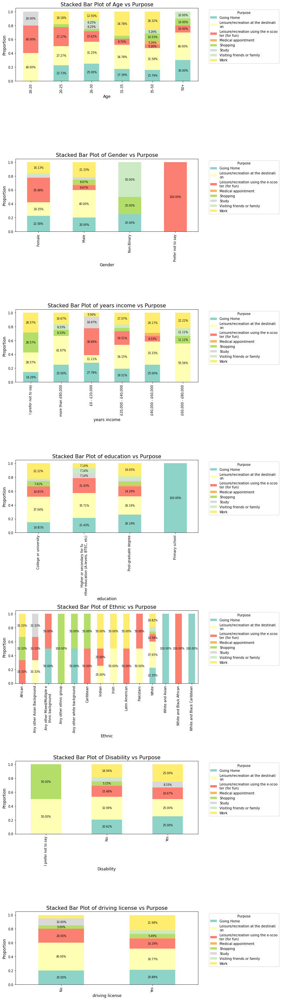

In [14]:
def handle_long_labels(ax):
    labels = ax.get_xticklabels()
    new_labels = []
    for label in labels:
        text = label.get_text()
        if len(text) > 26:  # if the label is too long
            text = text[:26] + '\n' + text[26:]  # add a line break after 15 characters
        new_labels.append(text)
    ax.set_xticklabels(new_labels)


# Define columns
columns = ['Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license']

# Create a subplot for each column
fig, axes = plt.subplots(nrows=len(columns), figsize=(12, 6 * len(columns)))

for ax, column in zip(axes, columns):
    # Create a crosstabulation of the selected column and 'Purpose'
    ct = pd.crosstab(user[column], user['Purpose'])
    
    # Convert counts to proportions
    ct = ct.divide(ct.sum(axis=1), axis=0)

    # Create the stacked bar plot
    ct.plot(kind='bar', stacked=True, cmap='Set3', ax=ax)
    
    # Add labels and title
    ax.set_title(f'Stacked Bar Plot of {column} vs Purpose', fontsize=16)
    ax.set_xlabel(column, fontsize=12)
    ax.set_ylabel('Proportion', fontsize=12)
    ax.legend(title='Purpose', bbox_to_anchor=(1.05, 1), loc='upper left')
    handle_long_labels(ax)  # handle long labels
    
    # Add annotations for each segment
    for rect in ax.patches:
        # Find where everything is located
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()
        
        # The height of the bar is the data value and can be used as the label
        label_text = f'{height:.2%}'  # e.g., '40.00%'
        
        # ax.text(x, y, text)
        label_x = x + width / 2
        label_y = y + height / 2

        # only plot labels greater than given width and height
        if height > 0.05:
            ax.text(label_x, label_y, label_text, ha='center', va='center', fontsize=8)
    
    # Adjust the legend to allow line breaks every 35 characters
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles, [label[:35] + '\n' + label[35:] if len(label) > 35 else label for label in labels],
              title='Purpose', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


### 1.2. Land use component and Temporal component

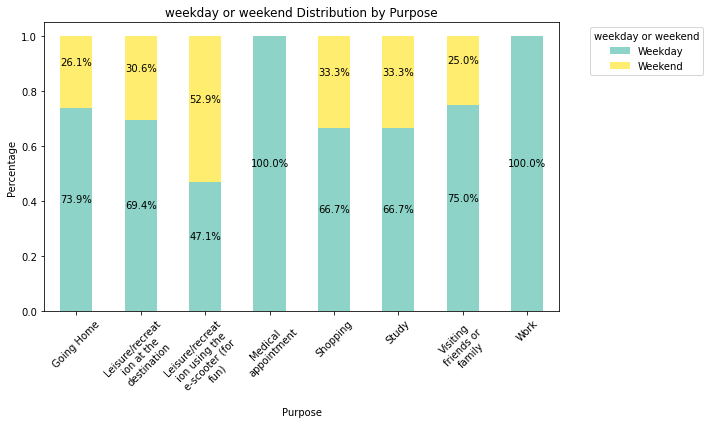

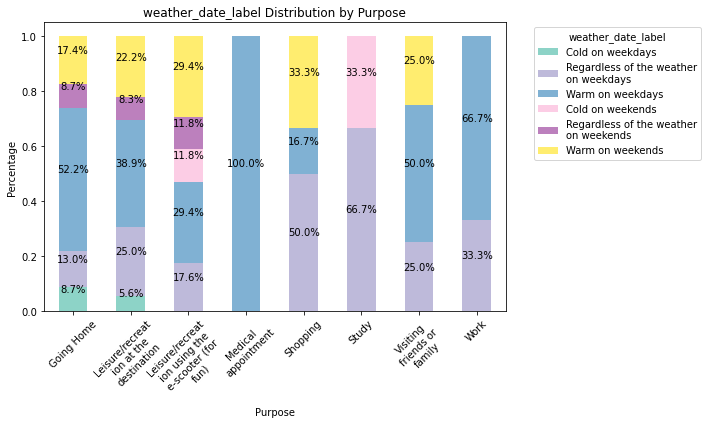

In [15]:
# Create stacked bar plots for each column
cols = ['weekday or weekend','weather_date_label']
for col in cols:
    plot_stacked_bars(user, ['Purpose', col], title=f'{col} Distribution by Purpose', xlabel='Purpose', legend_title=col)


### 2.3. Transport component and Individual component (experience by users)

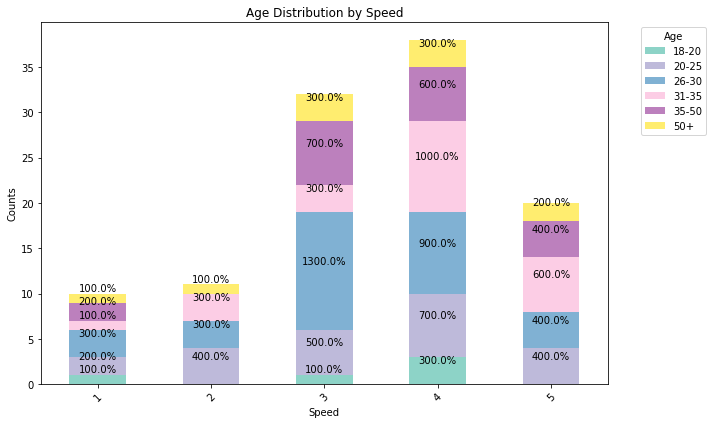

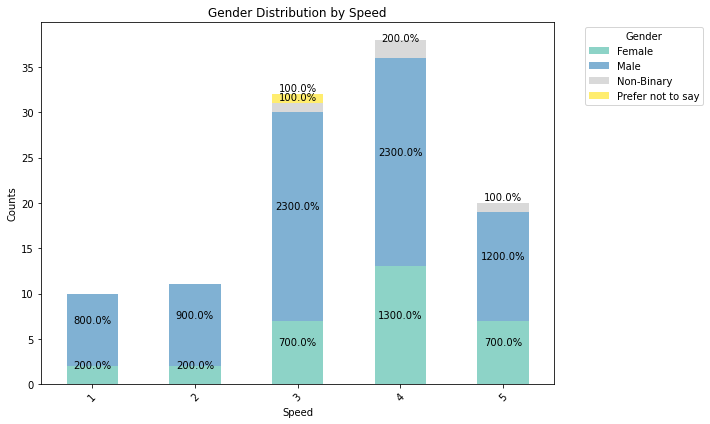

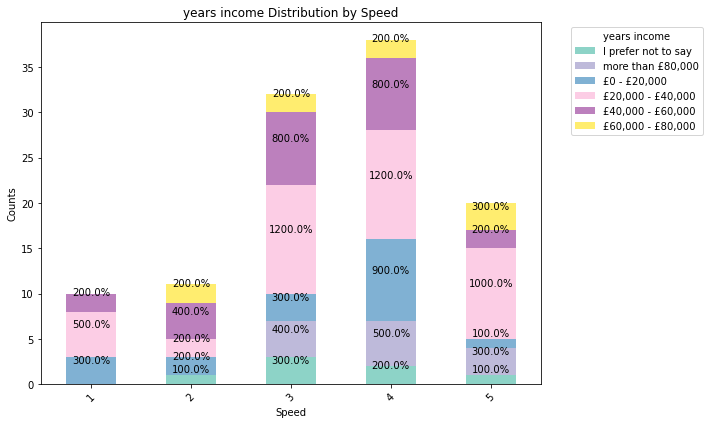

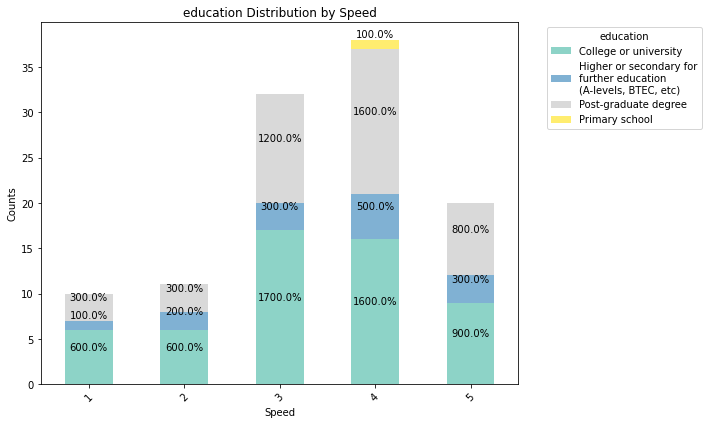

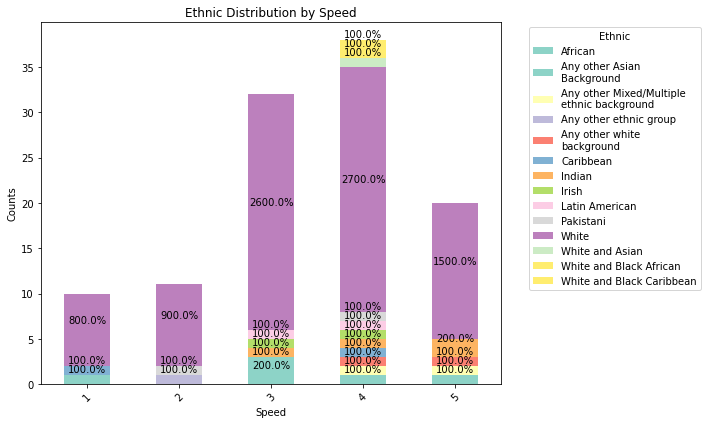

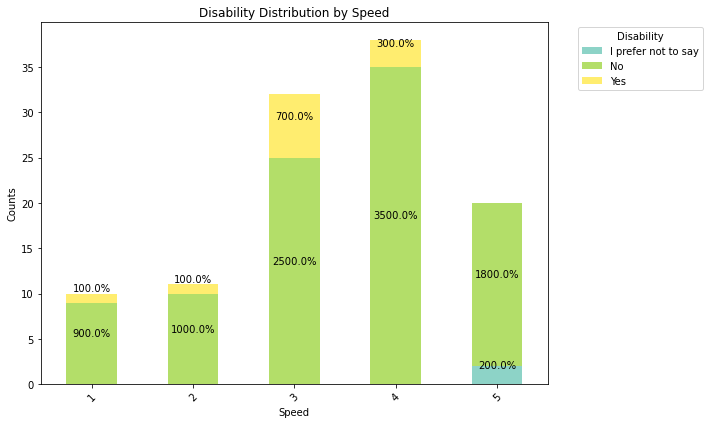

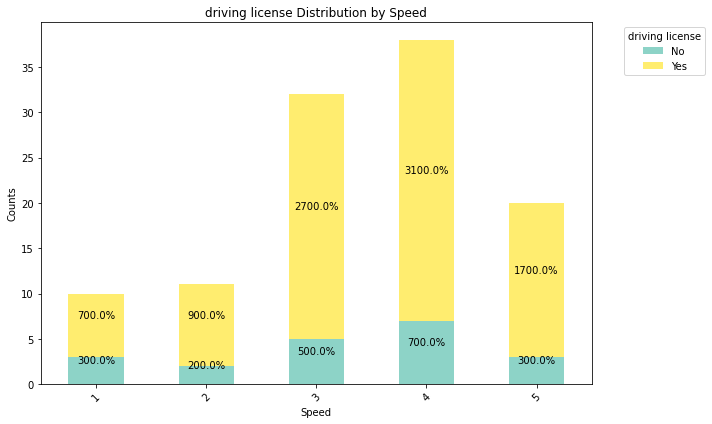

In [16]:
cols = ['Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license']
#trans = ['Speed','Comfort','Maneuverability of the vehicle','Time Availability (I can find one when I need it)','Place Availability (I can find one where I need it)','Coverage (It can take me where I need to go)','Usability of the app','Customer service','Trip Fare','Safety']
for col in cols:
    plot_stacked_bars_counts(user, ['Speed', col], title=f'{col} Distribution by Speed', xlabel='Speed', legend_title=col)


In [17]:
cols_radar = ['Speed', 'Comfort', 'Maneuverability of the vehicle', 'Time Availability (I can find one when I need it)', 
              'Place Availability (I can find one where I need it)', 'Coverage (It can take me where I need to go)', 
              'Usability of the app', 'Customer service', 'Trip Fare', 'Safety']

# Calculate the mean values for each age group for each of the columns
age_medians = user.groupby('Age')[cols_radar].median()
age_means = user.groupby('Age')[cols_radar].mean()
gender_medians = user.groupby('Gender')[cols_radar].median()
gender_means = user.groupby('Gender')[cols_radar].mean()
income_medians = user.groupby('years income')[cols_radar].median()
income_means = user.groupby('years income')[cols_radar].mean()
edu_medians = user.groupby('education')[cols_radar].median()
edu_means = user.groupby('education')[cols_radar].mean()
eth_medians = user.groupby('Ethnic')[cols_radar].median()
eth_means = user.groupby('Ethnic')[cols_radar].mean()
dis_medians = user.groupby('Disability')[cols_radar].median()
dis_means = user.groupby('Disability')[cols_radar].mean()
lic_medians = user.groupby('driving license')[cols_radar].median()
lic_means = user.groupby('driving license')[cols_radar].mean()

In [18]:
def wrap_labels_radar(text, max_chars):
    # Split the text by spaces
    words = text.split()

    # List to store the lines of text
    lines = []

    # List to store the current line of text
    current_line = []

    # For each word
    for word in words:
        # If the line is empty or the word can fit on the current line
        if not current_line or len(' '.join(current_line) + ' ' + word) <= max_chars:
            # Add the word to the current line
            current_line.append(word)
        else:
            # Otherwise, add the current line to the list of lines and start a new line
            lines.append(' '.join(current_line))
            current_line = [word]

    # Add the final line to the list of lines
    lines.append(' '.join(current_line))

    # Join the lines with line breaks and return the result
    return '\n'.join(lines)


In [19]:
def create_radar_chart(data, title, labels):
    # Number of variables
    num_vars = len(labels)

    # Compute angle for each axis
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

    # Create figure and polar axis
    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
    plt.title(title, size=20, color='blue', y=1.1)

    # Helper function to plot each age group on the radar chart
    def add_to_radar(ax, angles, data, color, label):
        # Make the plot repeat back to the start
        data = np.concatenate((data, [data[0]]))
        angles_ = angles + angles[:1]
        ax.fill(angles_, data, color=color, alpha=0.25)
        ax.plot(angles_, data, color=color, label=label)

    # Add each age group to the radar chart
    for i, age_group in enumerate(data.index):
        # Insert a line break after every 15 characters in the legend labels
        label = '\n'.join(wrap(age_group, 15))
        add_to_radar(ax, angles, data.loc[age_group].values, color=plt.cm.viridis(i / len(data.index)), label=label)

    # Fix axis to go in the right direction and start at 12 o'clock.
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)

    # Draw axis lines for each angle and label.
    ax.set_thetagrids(np.degrees(angles), labels)

    # Go through labels and adjust alignment based on where it is in the circle.
    for label, angle in zip(ax.get_xticklabels(), angles):
        if angle in (0, np.pi):
            label.set_horizontalalignment('center')
        elif 0 < angle < np.pi:
            label.set_horizontalalignment('left')
        else:
            label.set_horizontalalignment('right')

    # Ensure radar goes from 0 to 100.
    ax.set_ylim(0, 5)
    ax.yaxis.grid(True, color='gray', linestyle='--', linewidth=0.5)
    ax.set_xticklabels([wrap_labels_radar(t.get_text(), 15) for t in ax.get_xticklabels()])

    # Add legend and title
    ax.legend(loc='center left', bbox_to_anchor=(1.25, 0.5), fontsize='small')
    return fig, ax

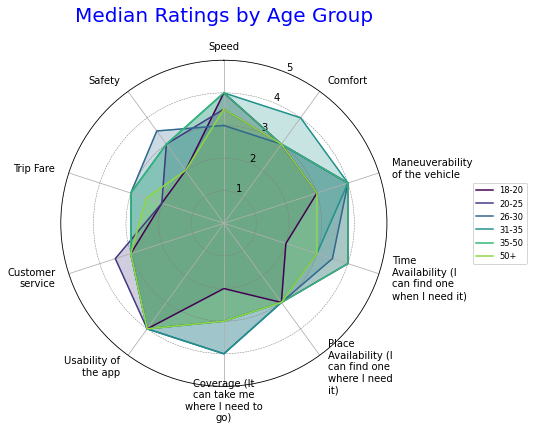

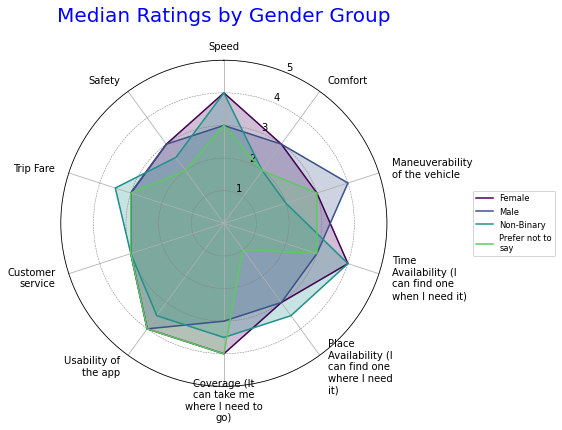

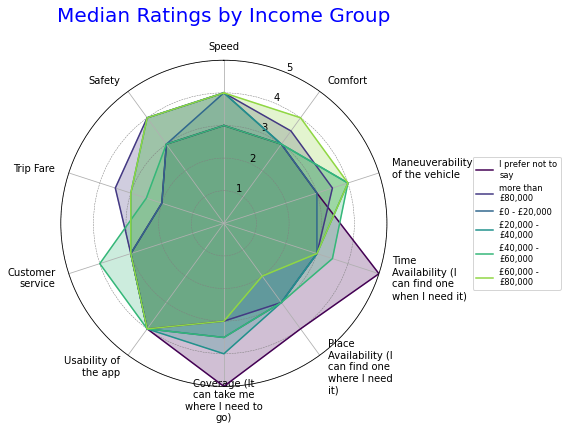

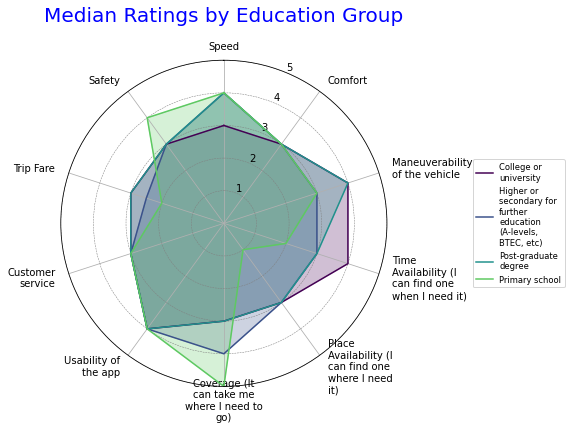

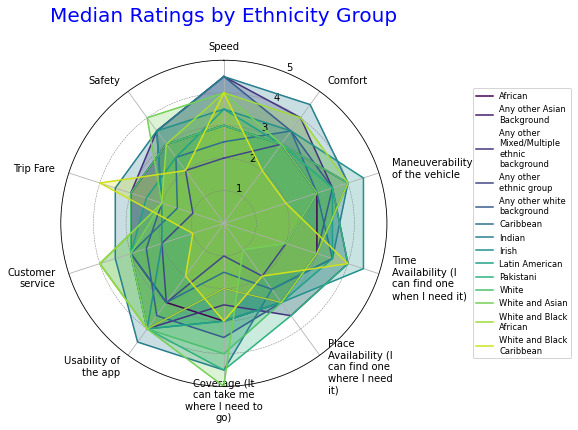

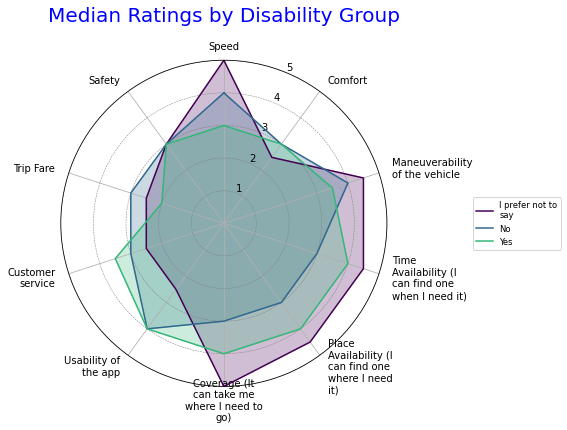

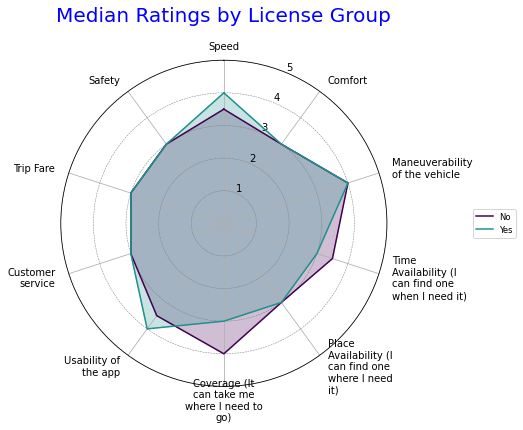

In [20]:
# Columns to be analyzed
cols_to_analyze = ['Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license']

# Store the dataframe names and dataframes in a dictionary
dfs = {'age': age_medians, 'gender': gender_medians, 'income': income_medians, 'education': edu_medians, 'ethnicity': eth_medians, 'disability': dis_medians, 'license': lic_medians}

# Loop through the dictionary to create a radar chart for each dataframe
for df_name, df in dfs.items():
    fig, ax = create_radar_chart(df, f'Median Ratings by {df_name.capitalize()} Group', df.columns)
    plt.show()

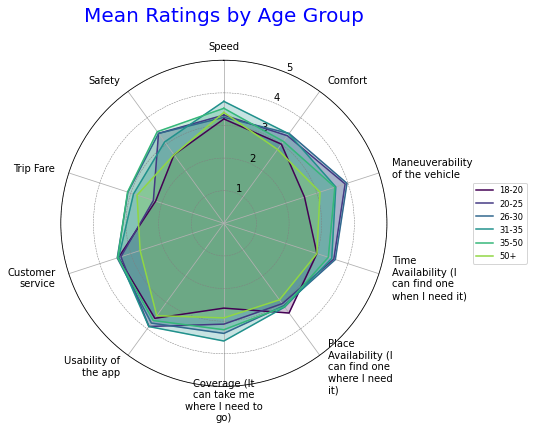

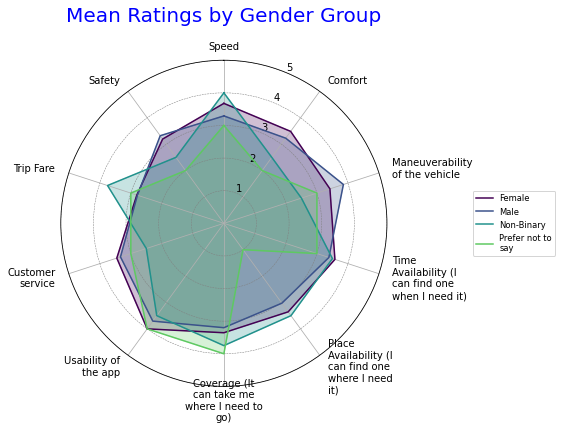

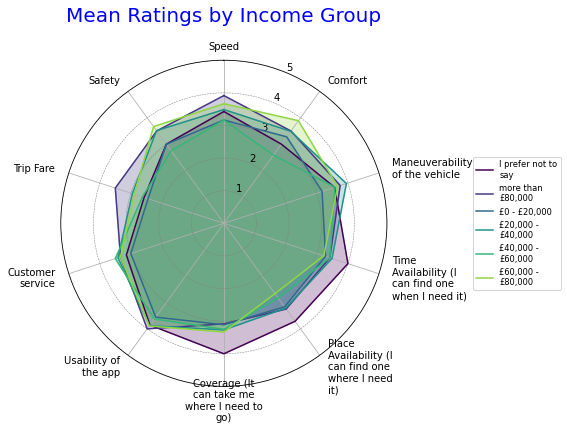

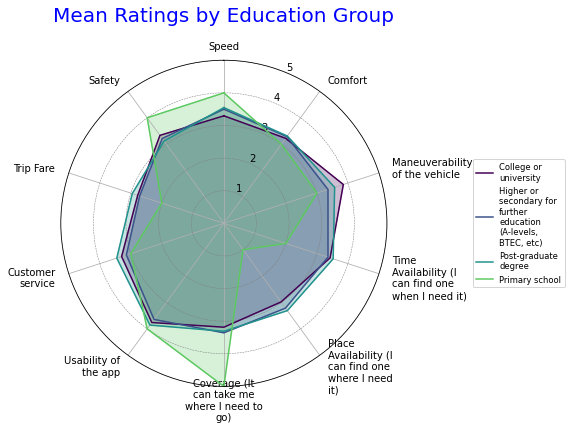

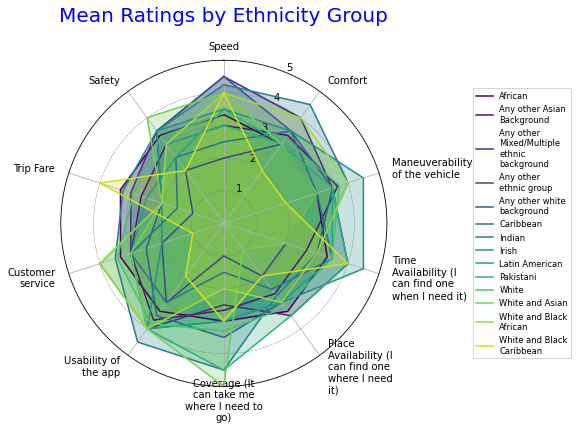

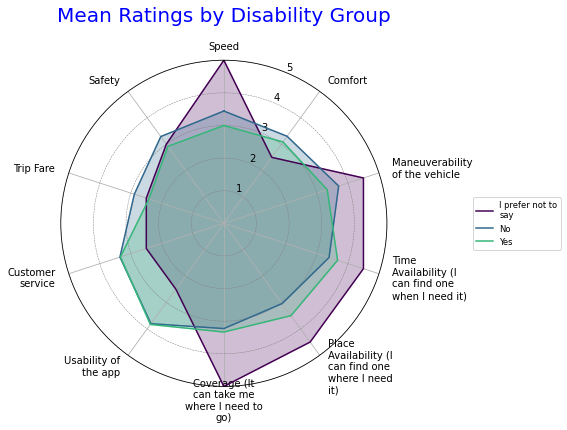

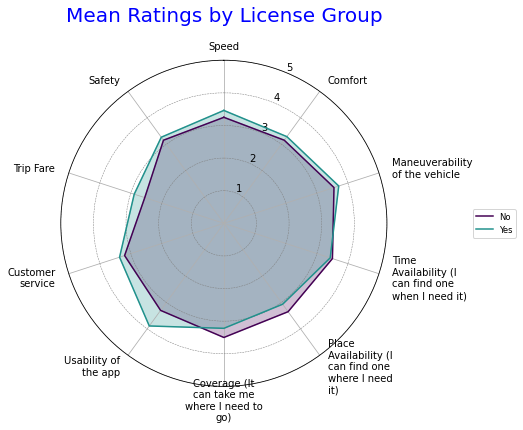

In [21]:
dfs = {'age': age_means, 'gender': gender_means, 'income': income_means, 'education': edu_means, 'ethnicity': eth_means, 'disability': dis_means, 'license': lic_means}

# Loop through the dictionary to create a radar chart for each dataframe
for df_name, df in dfs.items():
    fig, ax = create_radar_chart(df, f'Mean Ratings by {df_name.capitalize()} Group', df.columns)
    plt.show()

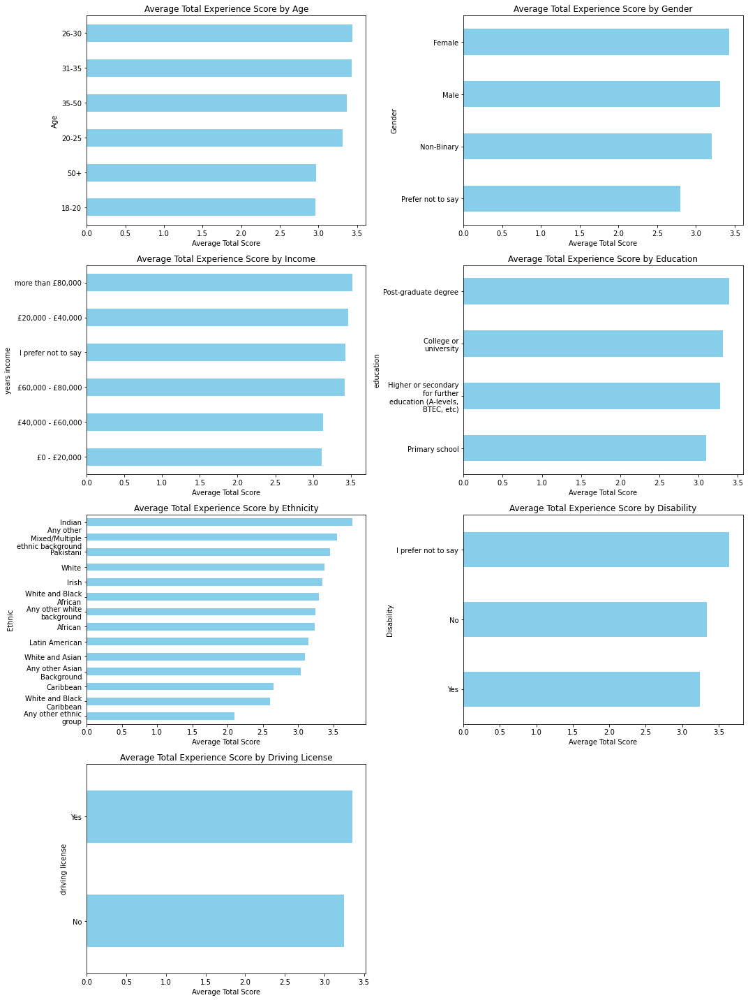

In [22]:
# Specifying the columns
cols_radar = ['Speed','Comfort','Maneuverability of the vehicle','Time Availability (I can find one when I need it)',
              'Place Availability (I can find one where I need it)','Coverage (It can take me where I need to go)',
              'Usability of the app','Customer service','Trip Fare','Safety']

# Creating a new column for the average of all the rating columns
user['total_avg'] = user[cols_radar].mean(axis=1)

# Creating dataframes for each of the demographic groups
age_avg_total = user.groupby('Age')['total_avg'].mean()
gender_avg_total = user.groupby('Gender')['total_avg'].mean()
income_avg_total = user.groupby('years income')['total_avg'].mean()
edu_avg_total = user.groupby('education')['total_avg'].mean()
ethnic_avg_total = user.groupby('Ethnic')['total_avg'].mean()
disability_avg_total = user.groupby('Disability')['total_avg'].mean()
license_avg_total = user.groupby('driving license')['total_avg'].mean()

# Storing the dataframes in a dictionary
avg_total_dfs = {
    'Age': age_avg_total,
    'Gender': gender_avg_total,
    'Income': income_avg_total,
    'Education': edu_avg_total,
    'Ethnicity': ethnic_avg_total,
    'Disability': disability_avg_total,
    'Driving License': license_avg_total
}

# Plotting the bar charts
fig, axs = plt.subplots(4, 2, figsize=(15, 20))
axs = axs.ravel()

for i, (group, df) in enumerate(avg_total_dfs.items()):
    ax = axs[i]
    df.sort_values().plot(kind='barh', ax=ax, color='skyblue')
    ax.set_xlabel('Average Total Score')
    ax.set_title(f'Average Total Experience Score by {group}')
    ax.set_yticklabels([wrap_labels(t.get_text(), 20) for t in ax.get_yticklabels()])

# Removing the last subplot as it is not used
fig.delaxes(axs[-1])

plt.tight_layout()
plt.show()


### 2.4. Transport component and Individual component (view by users)

#### 2.4.1. Negative impression (median)

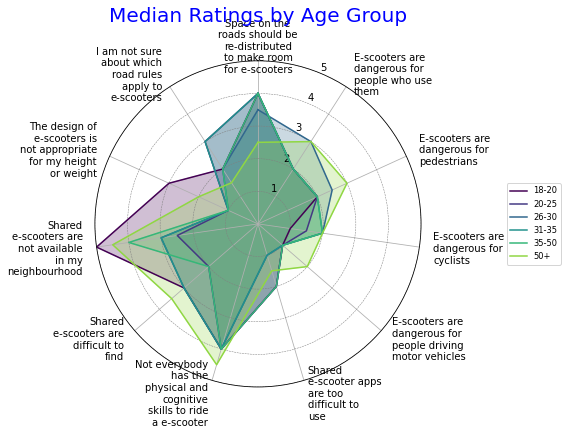

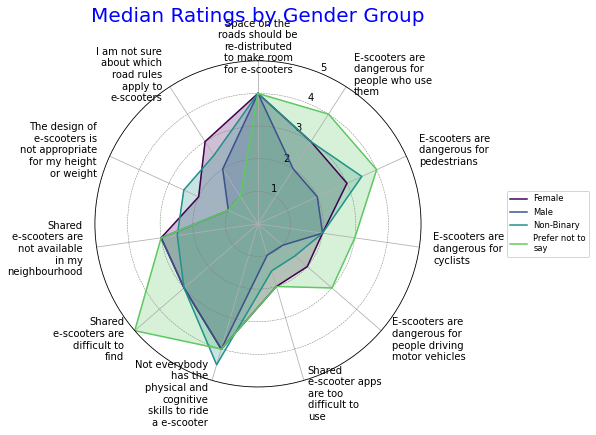

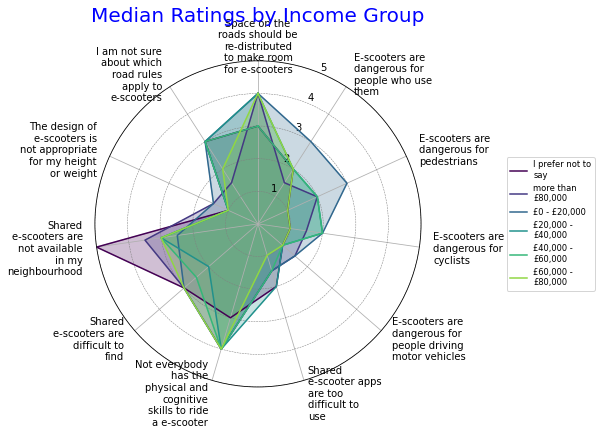

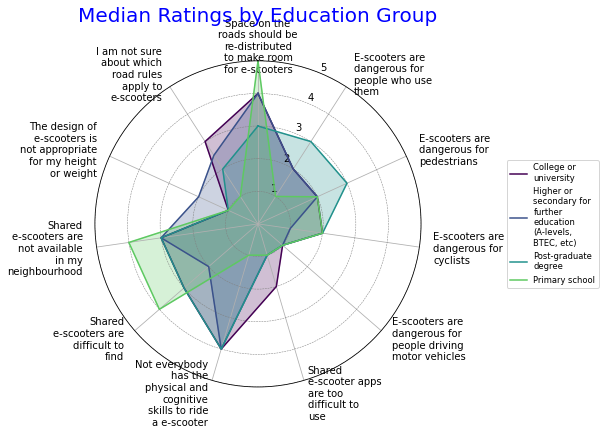

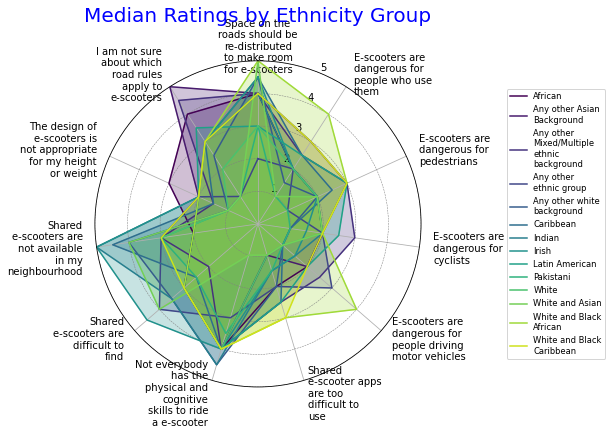

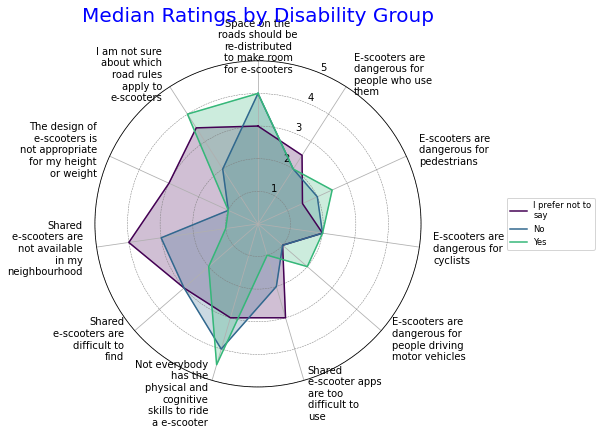

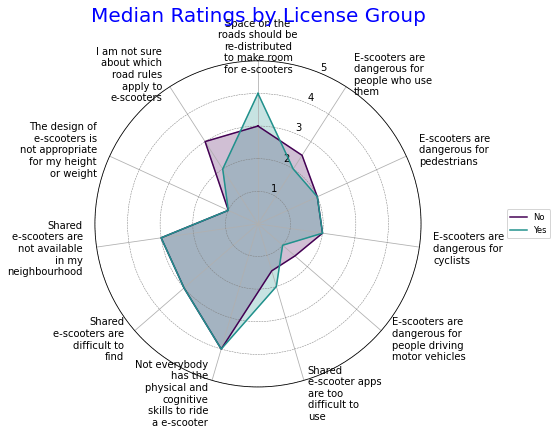

In [23]:
cols_radar = ['Space on the roads should be re-distributed to make room for e-scooters','E-scooters are dangerous for people who use them','E-scooters are dangerous for pedestrians','E-scooters are dangerous for cyclists',
              'E-scooters are dangerous for people driving motor vehicles','Shared e-scooter apps are too difficult to use','Not everybody has the physical and cognitive skills to ride a e-scooter',
              'Shared e-scooters are difficult to find','Shared e-scooters are not available in my neighbourhood',
              'The design of e-scooters is not appropriate for my height or weight','I am not sure about which road rules apply to e-scooters']

# Calculate the mean values for each age group for each of the columns
age_medians = user.groupby('Age')[cols_radar].median()
age_means = user.groupby('Age')[cols_radar].mean()
gender_medians = user.groupby('Gender')[cols_radar].median()
gender_means = user.groupby('Gender')[cols_radar].mean()
income_medians = user.groupby('years income')[cols_radar].median()
income_means = user.groupby('years income')[cols_radar].mean()
edu_medians = user.groupby('education')[cols_radar].median()
edu_means = user.groupby('education')[cols_radar].mean()
eth_medians = user.groupby('Ethnic')[cols_radar].median()
eth_means = user.groupby('Ethnic')[cols_radar].mean()
dis_medians = user.groupby('Disability')[cols_radar].median()
dis_means = user.groupby('Disability')[cols_radar].mean()
lic_medians = user.groupby('driving license')[cols_radar].median()
lic_means = user.groupby('driving license')[cols_radar].mean()

# Columns to be analyzed
cols_to_analyze = ['Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license']

# Store the dataframe names and dataframes in a dictionary
dfs = {'age': age_medians, 'gender': gender_medians, 'income': income_medians, 'education': edu_medians, 'ethnicity': eth_medians, 'disability': dis_medians, 'license': lic_medians}

# Loop through the dictionary to create a radar chart for each dataframe
for df_name, df in dfs.items():
    fig, ax = create_radar_chart(df, f'Median Ratings by {df_name.capitalize()} Group', df.columns)
    plt.show()

#### 2.4.2. Positive impression (median)

In [25]:
cols_radar = ['Riding e-scooters makes people feel free','Riding e-scooters makes people happy','Riding e-scooters makes people feel more independent',
              'Riding an e-scooter is more sustainable than using other modes of transport',
              'A person is safe from crime when using e-scooters',
              'A person is safe from sexual harassment when using e-scooters']

# Calculate the mean values for each age group for each of the columns
age_medians = user.groupby('Age')[cols_radar].median()
age_means = user.groupby('Age')[cols_radar].mean()
gender_medians = user.groupby('Gender')[cols_radar].median()
gender_means = user.groupby('Gender')[cols_radar].mean()
income_medians = user.groupby('years income')[cols_radar].median()
income_means = user.groupby('years income')[cols_radar].mean()
edu_medians = user.groupby('education')[cols_radar].median()
edu_means = user.groupby('education')[cols_radar].mean()
eth_medians = user.groupby('Ethnic')[cols_radar].median()
eth_means = user.groupby('Ethnic')[cols_radar].mean()
dis_medians = user.groupby('Disability')[cols_radar].median()
dis_means = user.groupby('Disability')[cols_radar].mean()
lic_medians = user.groupby('driving license')[cols_radar].median()
lic_means = user.groupby('driving license')[cols_radar].mean()

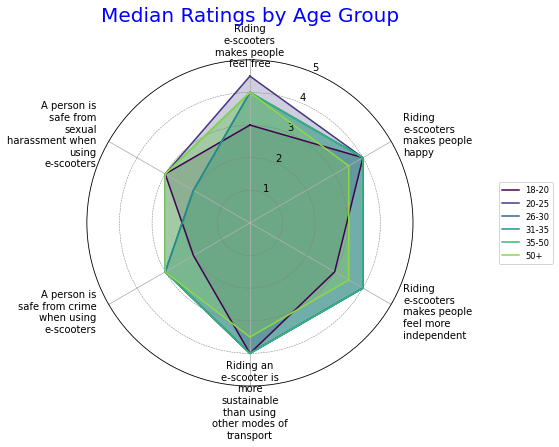

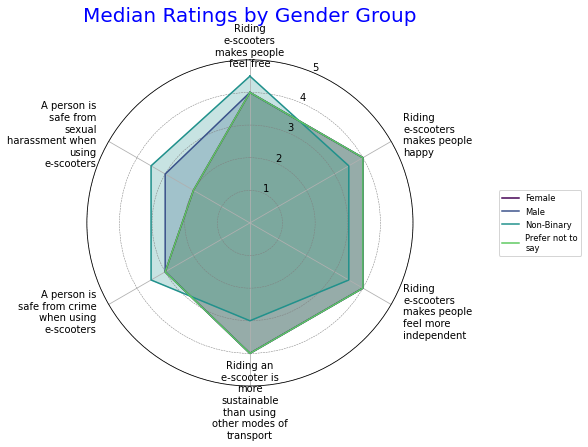

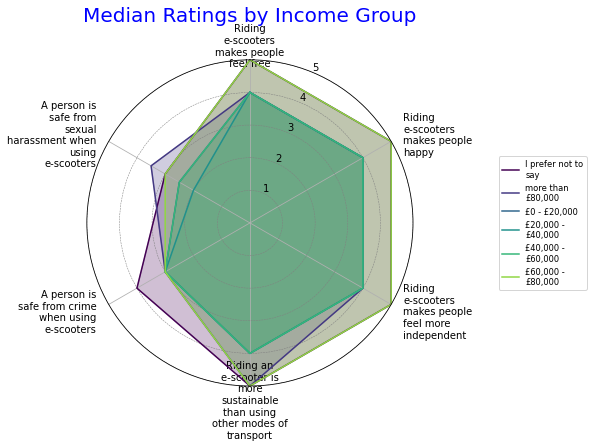

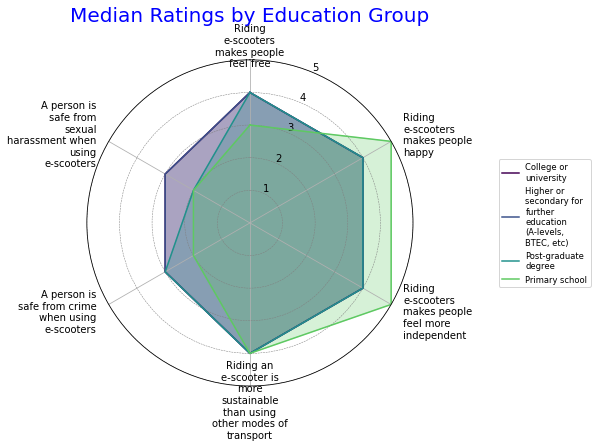

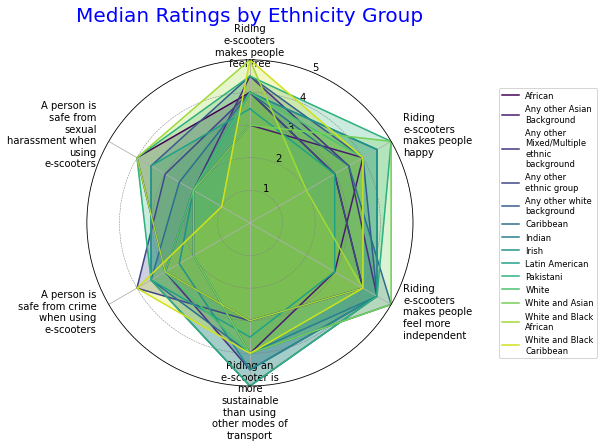

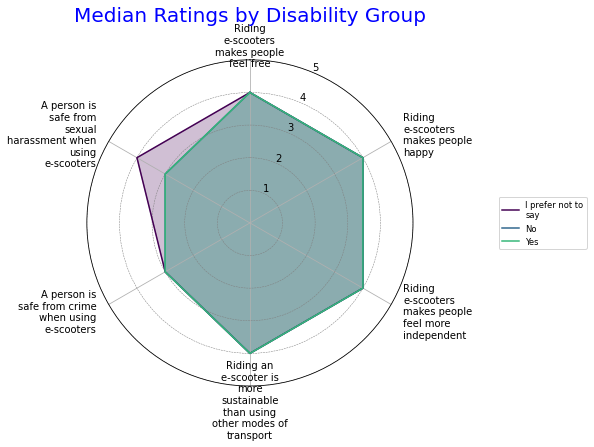

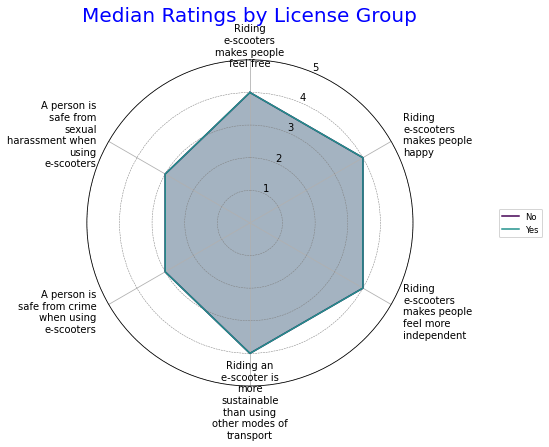

In [26]:
# Columns to be analyzed
cols_to_analyze = ['Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license']

# Store the dataframe names and dataframes in a dictionary
dfs = {'age': age_medians, 'gender': gender_medians, 'income': income_medians, 'education': edu_medians, 'ethnicity': eth_medians, 'disability': dis_medians, 'license': lic_medians}

# Loop through the dictionary to create a radar chart for each dataframe
for df_name, df in dfs.items():
    fig, ax = create_radar_chart(df, f'Median Ratings by {df_name.capitalize()} Group', df.columns)
    plt.show()

#### 2.4.3. Average Total Score of Negative Impressions

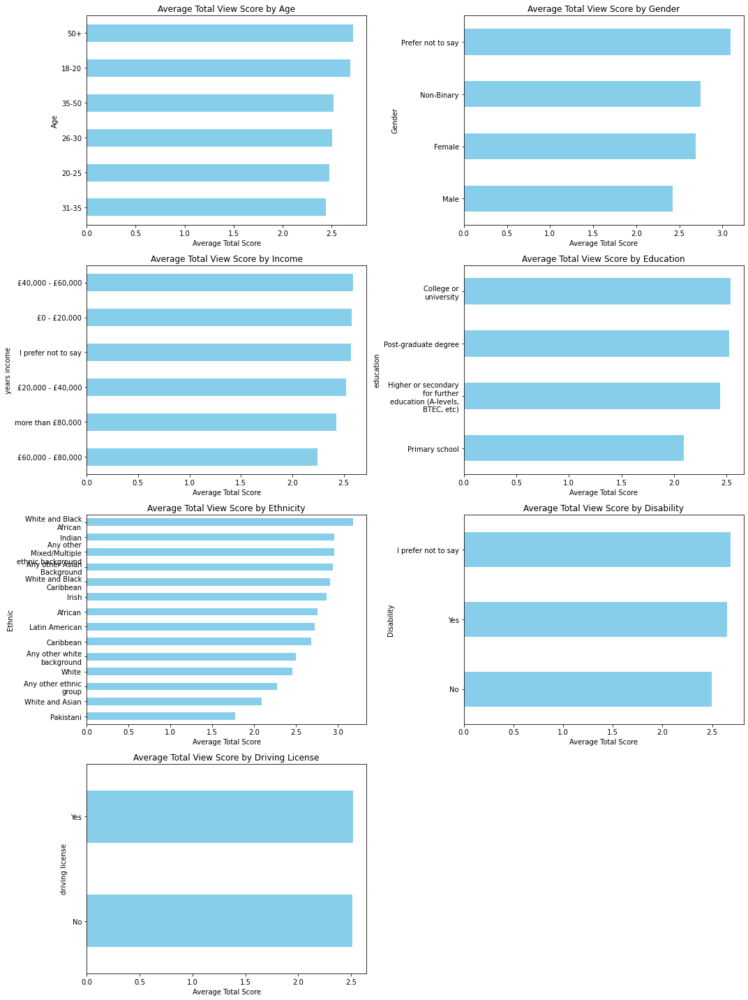

In [28]:
# Specifying the columns
cols_radar = ['Space on the roads should be re-distributed to make room for e-scooters','E-scooters are dangerous for people who use them','E-scooters are dangerous for pedestrians','E-scooters are dangerous for cyclists',
              'E-scooters are dangerous for people driving motor vehicles','Shared e-scooter apps are too difficult to use','Not everybody has the physical and cognitive skills to ride a e-scooter',
              'Shared e-scooters are difficult to find','Shared e-scooters are not available in my neighbourhood',
              'The design of e-scooters is not appropriate for my height or weight','I am not sure about which road rules apply to e-scooters']

# Creating a new column for the average of all the rating columns
user['total_avg'] = user[cols_radar].mean(axis=1)

# Creating dataframes for each of the demographic groups
age_avg_total = user.groupby('Age')['total_avg'].mean()
gender_avg_total = user.groupby('Gender')['total_avg'].mean()
income_avg_total = user.groupby('years income')['total_avg'].mean()
edu_avg_total = user.groupby('education')['total_avg'].mean()
ethnic_avg_total = user.groupby('Ethnic')['total_avg'].mean()
disability_avg_total = user.groupby('Disability')['total_avg'].mean()
license_avg_total = user.groupby('driving license')['total_avg'].mean()

# Storing the dataframes in a dictionary
avg_total_dfs = {
    'Age': age_avg_total,
    'Gender': gender_avg_total,
    'Income': income_avg_total,
    'Education': edu_avg_total,
    'Ethnicity': ethnic_avg_total,
    'Disability': disability_avg_total,
    'Driving License': license_avg_total
}

# Plotting the bar charts
fig, axs = plt.subplots(4, 2, figsize=(15, 20))
axs = axs.ravel()

for i, (group, df) in enumerate(avg_total_dfs.items()):
    ax = axs[i]
    df.sort_values().plot(kind='barh', ax=ax, color='skyblue')
    ax.set_xlabel('Average Total Score')
    ax.set_title(f'Average Total View Score by {group}')
    ax.set_yticklabels([wrap_labels(t.get_text(), 20) for t in ax.get_yticklabels()])

# Removing the last subplot as it is not used
fig.delaxes(axs[-1])

plt.tight_layout()
plt.show()


#### 2.4.4. Average Total Score of Positive Impressions

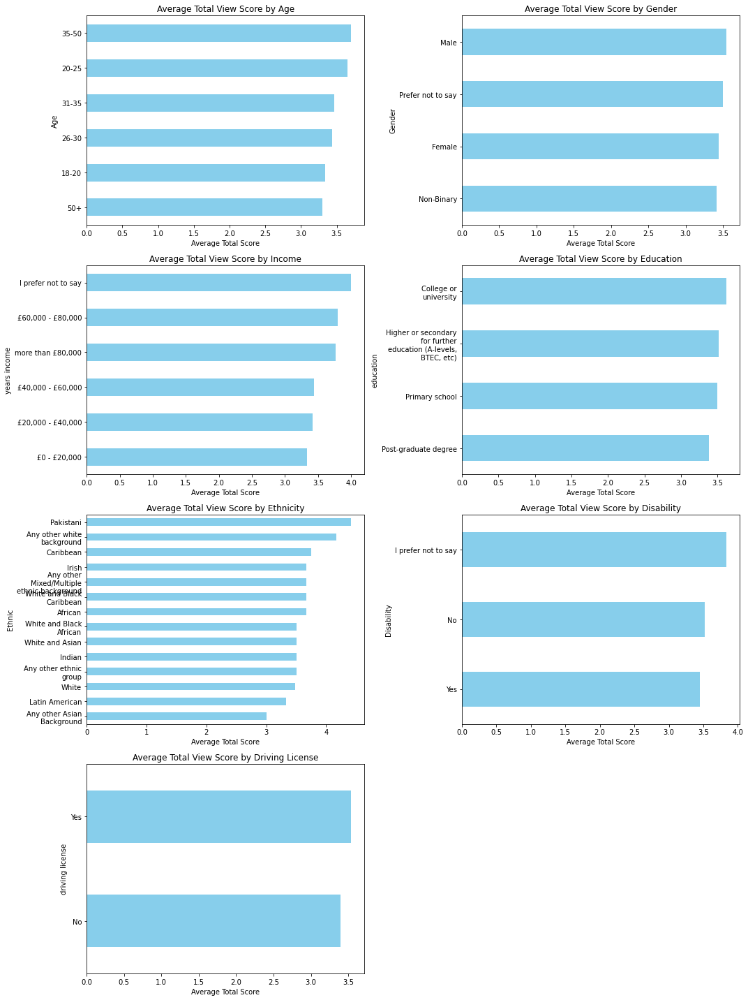

In [29]:
# Specifying the columns
cols_radar = ['Riding e-scooters makes people feel free','Riding e-scooters makes people happy','Riding e-scooters makes people feel more independent',
              'Riding an e-scooter is more sustainable than using other modes of transport',
              'A person is safe from crime when using e-scooters',
              'A person is safe from sexual harassment when using e-scooters']

# Creating a new column for the average of all the rating columns
user['total_avg'] = user[cols_radar].mean(axis=1)

# Creating dataframes for each of the demographic groups
age_avg_total = user.groupby('Age')['total_avg'].mean()
gender_avg_total = user.groupby('Gender')['total_avg'].mean()
income_avg_total = user.groupby('years income')['total_avg'].mean()
edu_avg_total = user.groupby('education')['total_avg'].mean()
ethnic_avg_total = user.groupby('Ethnic')['total_avg'].mean()
disability_avg_total = user.groupby('Disability')['total_avg'].mean()
license_avg_total = user.groupby('driving license')['total_avg'].mean()

# Storing the dataframes in a dictionary
avg_total_dfs = {
    'Age': age_avg_total,
    'Gender': gender_avg_total,
    'Income': income_avg_total,
    'Education': edu_avg_total,
    'Ethnicity': ethnic_avg_total,
    'Disability': disability_avg_total,
    'Driving License': license_avg_total
}

# Plotting the bar charts
fig, axs = plt.subplots(4, 2, figsize=(15, 20))
axs = axs.ravel()

for i, (group, df) in enumerate(avg_total_dfs.items()):
    ax = axs[i]
    df.sort_values().plot(kind='barh', ax=ax, color='skyblue')
    ax.set_xlabel('Average Total Score')
    ax.set_title(f'Average Total View Score by {group}')
    ax.set_yticklabels([wrap_labels(t.get_text(), 20) for t in ax.get_yticklabels()])

# Removing the last subplot as it is not used
fig.delaxes(axs[-1])

plt.tight_layout()
plt.show()


#### 2.4.5. Positive and negative evaluation difference

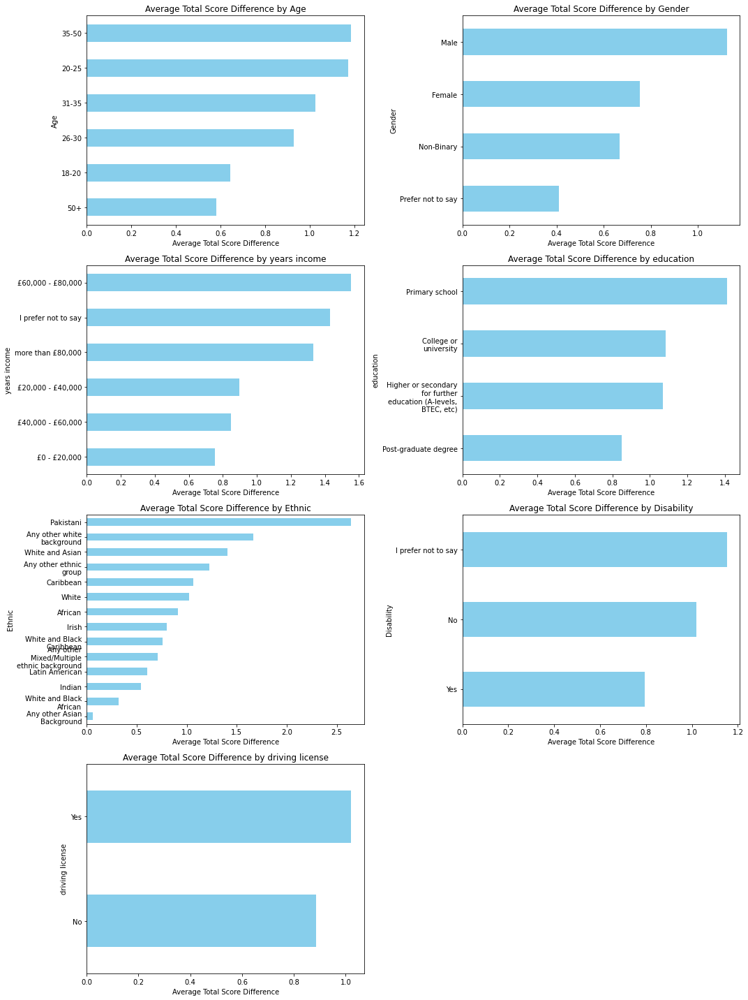

In [30]:
cols_radar_positive = ['Riding e-scooters makes people feel free','Riding e-scooters makes people happy','Riding e-scooters makes people feel more independent',
              'Riding an e-scooter is more sustainable than using other modes of transport',
              'A person is safe from crime when using e-scooters',
              'A person is safe from sexual harassment when using e-scooters']

cols_radar_negative = ['Space on the roads should be re-distributed to make room for e-scooters','E-scooters are dangerous for people who use them','E-scooters are dangerous for pedestrians','E-scooters are dangerous for cyclists',
              'E-scooters are dangerous for people driving motor vehicles','Shared e-scooter apps are too difficult to use','Not everybody has the physical and cognitive skills to ride a e-scooter',
              'Shared e-scooters are difficult to find','Shared e-scooters are not available in my neighbourhood',
              'The design of e-scooters is not appropriate for my height or weight','I am not sure about which road rules apply to e-scooters']

# Creating a new column for the average of all the rating columns
user['total_avg_positive'] = user[cols_radar_positive].mean(axis=1)
user['total_avg_negative'] = user[cols_radar_negative].mean(axis=1)

# Creating dataframes for each of the demographic groups
cols_demographic = ['Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license']
avg_total_positive_dfs = {col: user.groupby(col)['total_avg_positive'].mean() for col in cols_demographic}
avg_total_negative_dfs = {col: user.groupby(col)['total_avg_negative'].mean() for col in cols_demographic}

# Calculate the difference between the positive and negative average total scores for each demographic group
diff_avg_total_dfs = {}

for group in avg_total_positive_dfs.keys():
    diff_avg_total_dfs[group] = avg_total_positive_dfs[group] - avg_total_negative_dfs[group]

# Plotting the bar charts
fig, axs = plt.subplots(4, 2, figsize=(15, 20))
axs = axs.ravel()

for i, (group, df) in enumerate(diff_avg_total_dfs.items()):
    ax = axs[i]
    df.sort_values().plot(kind='barh', ax=ax, color='skyblue')
    ax.set_xlabel('Average Total Score Difference')
    ax.set_title(f'Average Total Score Difference by {group}')
    ax.set_yticklabels([wrap_labels(t.get_text(), 20) for t in ax.get_yticklabels()])

# Removing the last subplot as it is not used
fig.delaxes(axs[-1])

plt.tight_layout()
plt.show()

### 2.5. Transport component and Individual component (view by non-users)

#### 2.5.1. Negative impression (median)

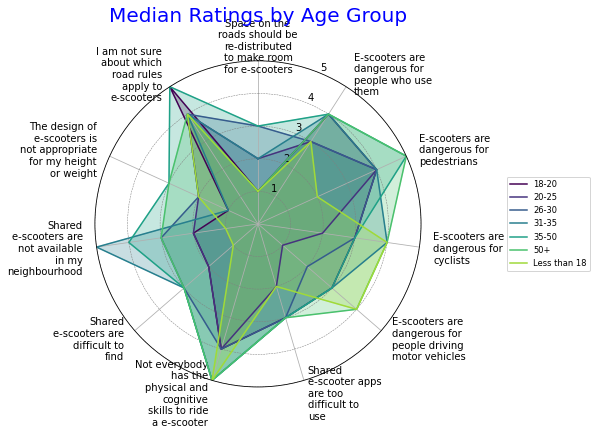

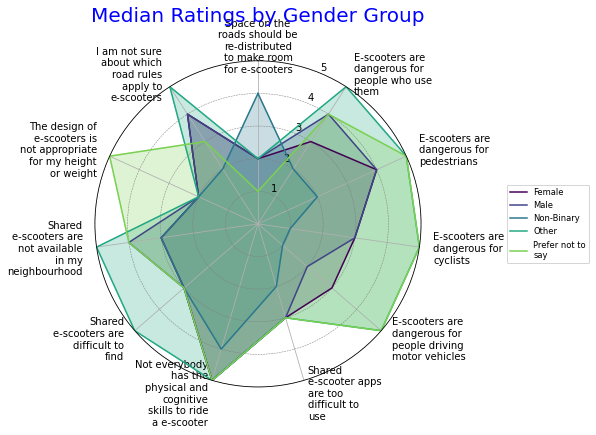

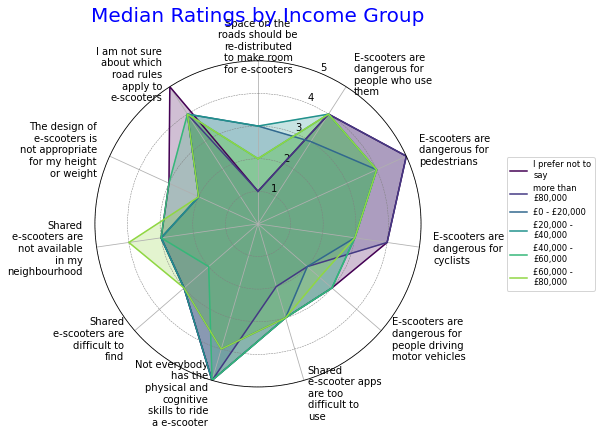

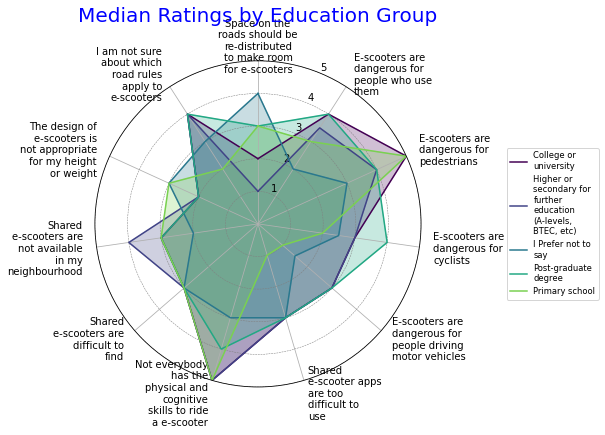

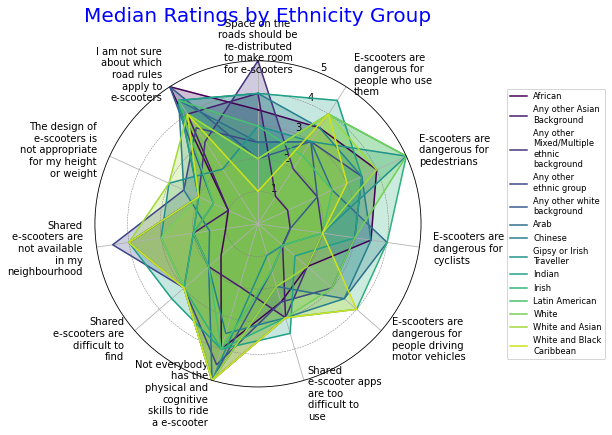

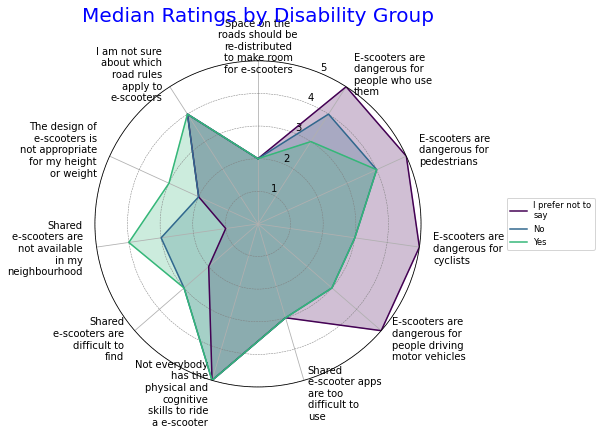

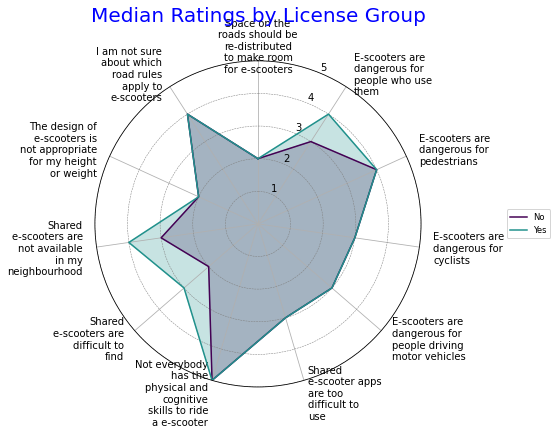

In [31]:
cols_radar = ['Space on the roads should be re-distributed to make room for e-scooters','E-scooters are dangerous for people who use them','E-scooters are dangerous for pedestrians','E-scooters are dangerous for cyclists',
              'E-scooters are dangerous for people driving motor vehicles','Shared e-scooter apps are too difficult to use','Not everybody has the physical and cognitive skills to ride a e-scooter',
              'Shared e-scooters are difficult to find','Shared e-scooters are not available in my neighbourhood',
              'The design of e-scooters is not appropriate for my height or weight','I am not sure about which road rules apply to e-scooters']

# Calculate the mean values for each age group for each of the columns
age_medians = nonuser.groupby('Age')[cols_radar].median()
age_means = nonuser.groupby('Age')[cols_radar].mean()
gender_medians = nonuser.groupby('Gender')[cols_radar].median()
gender_means = nonuser.groupby('Gender')[cols_radar].mean()
income_medians = nonuser.groupby('years income')[cols_radar].median()
income_means = nonuser.groupby('years income')[cols_radar].mean()
edu_medians = nonuser.groupby('education')[cols_radar].median()
edu_means = nonuser.groupby('education')[cols_radar].mean()
eth_medians = nonuser.groupby('Ethnic')[cols_radar].median()
eth_means = nonuser.groupby('Ethnic')[cols_radar].mean()
dis_medians = nonuser.groupby('Disability')[cols_radar].median()
dis_means = nonuser.groupby('Disability')[cols_radar].mean()
lic_medians = nonuser.groupby('driving license')[cols_radar].median()
lic_means = nonuser.groupby('driving license')[cols_radar].mean()

# Columns to be analyzed
cols_to_analyze = ['Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license']

# Store the dataframe names and dataframes in a dictionary
dfs = {'age': age_medians, 'gender': gender_medians, 'income': income_medians, 'education': edu_medians, 'ethnicity': eth_medians, 'disability': dis_medians, 'license': lic_medians}

# Loop through the dictionary to create a radar chart for each dataframe
for df_name, df in dfs.items():
    fig, ax = create_radar_chart(df, f'Median Ratings by {df_name.capitalize()} Group', df.columns)
    plt.show()

#### 2.5.2. Positive impression (median)

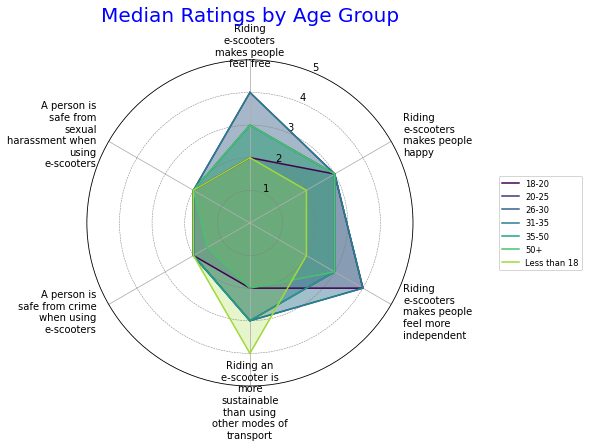

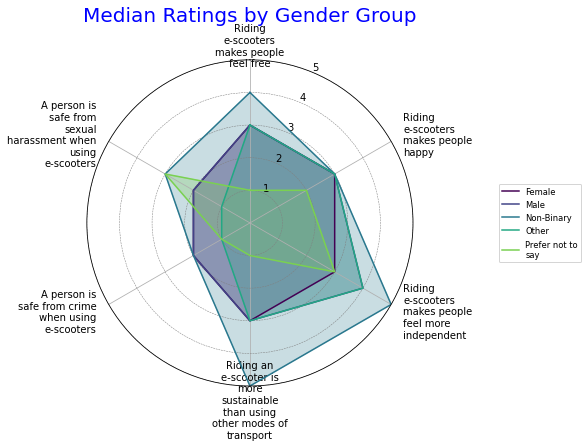

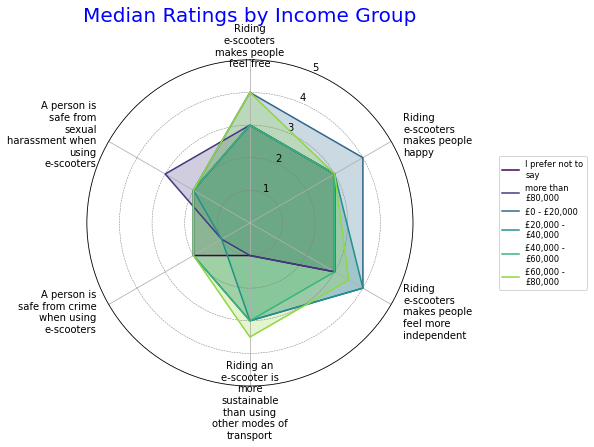

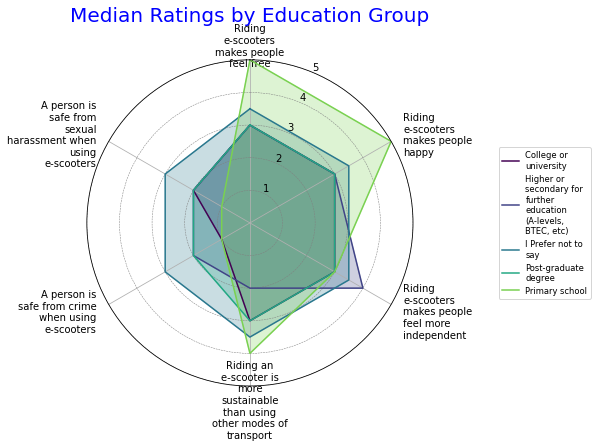

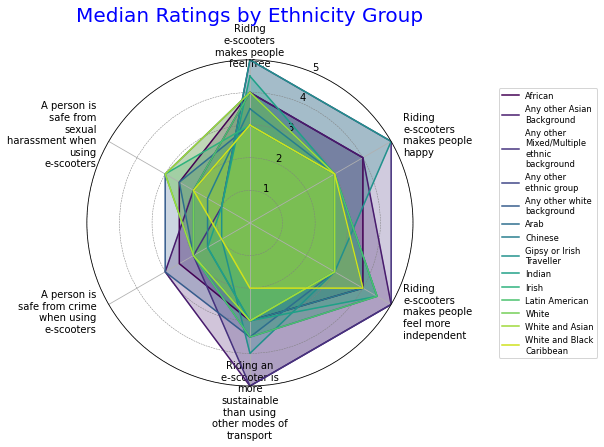

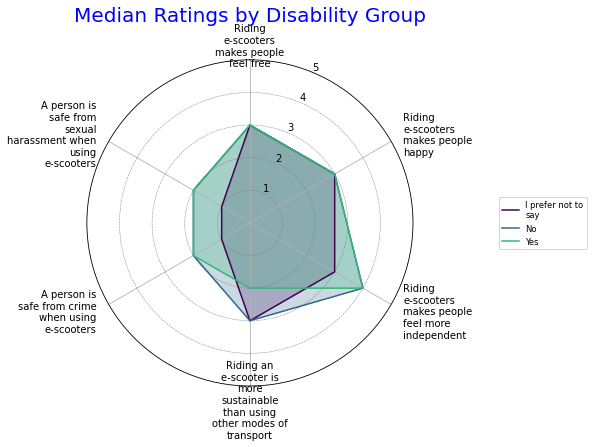

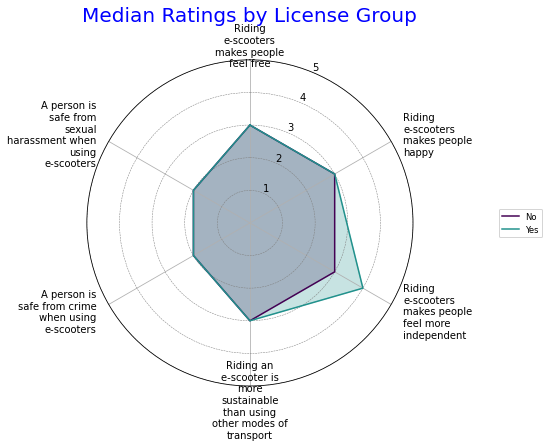

In [33]:
cols_radar = ['Riding e-scooters makes people feel free','Riding e-scooters makes people happy','Riding e-scooters makes people feel more independent',
              'Riding an e-scooter is more sustainable than using other modes of transport',
              'A person is safe from crime when using e-scooters',
              'A person is safe from sexual harassment when using e-scooters']

# Calculate the mean values for each age group for each of the columns
age_medians = nonuser.groupby('Age')[cols_radar].median()
age_means = nonuser.groupby('Age')[cols_radar].mean()
gender_medians = nonuser.groupby('Gender')[cols_radar].median()
gender_means = nonuser.groupby('Gender')[cols_radar].mean()
income_medians = nonuser.groupby('years income')[cols_radar].median()
income_means = nonuser.groupby('years income')[cols_radar].mean()
edu_medians = nonuser.groupby('education')[cols_radar].median()
edu_means = nonuser.groupby('education')[cols_radar].mean()
eth_medians = nonuser.groupby('Ethnic')[cols_radar].median()
eth_means = nonuser.groupby('Ethnic')[cols_radar].mean()
dis_medians = nonuser.groupby('Disability')[cols_radar].median()
dis_means = nonuser.groupby('Disability')[cols_radar].mean()
lic_medians = nonuser.groupby('driving license')[cols_radar].median()
lic_means = nonuser.groupby('driving license')[cols_radar].mean()

# Columns to be analyzed
cols_to_analyze = ['Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license']

# Store the dataframe names and dataframes in a dictionary
dfs = {'age': age_medians, 'gender': gender_medians, 'income': income_medians, 'education': edu_medians, 'ethnicity': eth_medians, 'disability': dis_medians, 'license': lic_medians}

# Loop through the dictionary to create a radar chart for each dataframe
for df_name, df in dfs.items():
    fig, ax = create_radar_chart(df, f'Median Ratings by {df_name.capitalize()} Group', df.columns)
    plt.show()

#### 2.5.3. Average Total Score of Negative Impressions

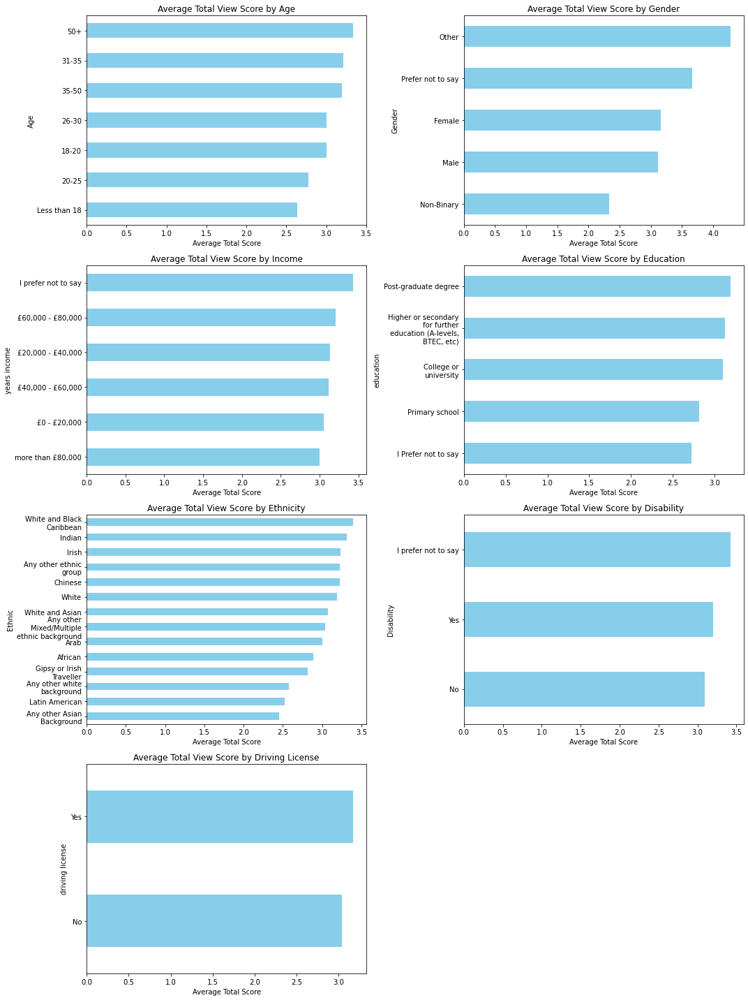

In [35]:
# Specifying the columns
cols_radar = ['Space on the roads should be re-distributed to make room for e-scooters','E-scooters are dangerous for people who use them','E-scooters are dangerous for pedestrians','E-scooters are dangerous for cyclists',
              'E-scooters are dangerous for people driving motor vehicles','Shared e-scooter apps are too difficult to use','Not everybody has the physical and cognitive skills to ride a e-scooter',
              'Shared e-scooters are difficult to find','Shared e-scooters are not available in my neighbourhood',
              'The design of e-scooters is not appropriate for my height or weight','I am not sure about which road rules apply to e-scooters']

# Creating a new column for the average of all the rating columns
nonuser['total_avg'] = nonuser[cols_radar].mean(axis=1)

# Creating dataframes for each of the demographic groups
age_avg_total = nonuser.groupby('Age')['total_avg'].mean()
gender_avg_total = nonuser.groupby('Gender')['total_avg'].mean()
income_avg_total = nonuser.groupby('years income')['total_avg'].mean()
edu_avg_total = nonuser.groupby('education')['total_avg'].mean()
ethnic_avg_total = nonuser.groupby('Ethnic')['total_avg'].mean()
disability_avg_total = nonuser.groupby('Disability')['total_avg'].mean()
license_avg_total = nonuser.groupby('driving license')['total_avg'].mean()

# Storing the dataframes in a dictionary
avg_total_dfs = {
    'Age': age_avg_total,
    'Gender': gender_avg_total,
    'Income': income_avg_total,
    'Education': edu_avg_total,
    'Ethnicity': ethnic_avg_total,
    'Disability': disability_avg_total,
    'Driving License': license_avg_total
}

# Plotting the bar charts
fig, axs = plt.subplots(4, 2, figsize=(15, 20))
axs = axs.ravel()

for i, (group, df) in enumerate(avg_total_dfs.items()):
    ax = axs[i]
    df.sort_values().plot(kind='barh', ax=ax, color='skyblue')
    ax.set_xlabel('Average Total Score')
    ax.set_title(f'Average Total View Score by {group}')
    ax.set_yticklabels([wrap_labels(t.get_text(), 20) for t in ax.get_yticklabels()])

# Removing the last subplot as it is not used
fig.delaxes(axs[-1])

plt.tight_layout()
plt.show()


#### 2.5.4. Average Total Score of Positive Impressions

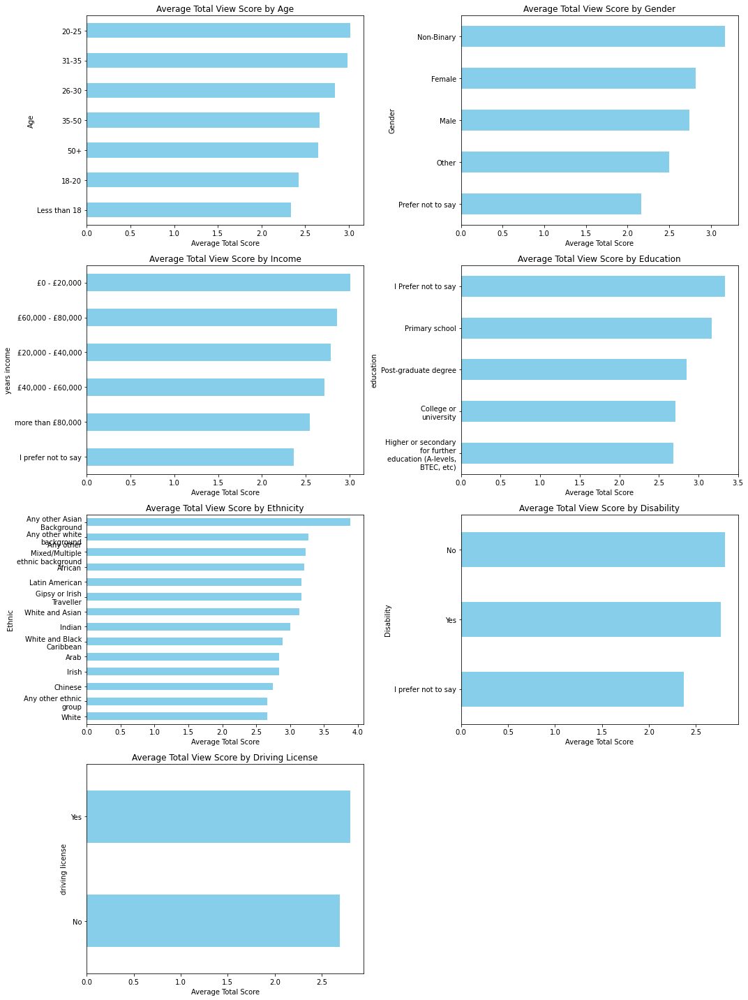

In [36]:
# Specifying the columns
cols_radar = ['Riding e-scooters makes people feel free','Riding e-scooters makes people happy','Riding e-scooters makes people feel more independent',
              'Riding an e-scooter is more sustainable than using other modes of transport',
              'A person is safe from crime when using e-scooters',
              'A person is safe from sexual harassment when using e-scooters']

# Creating a new column for the average of all the rating columns
nonuser['total_avg'] = nonuser[cols_radar].mean(axis=1)

# Creating dataframes for each of the demographic groups
age_avg_total = nonuser.groupby('Age')['total_avg'].mean()
gender_avg_total = nonuser.groupby('Gender')['total_avg'].mean()
income_avg_total = nonuser.groupby('years income')['total_avg'].mean()
edu_avg_total = nonuser.groupby('education')['total_avg'].mean()
ethnic_avg_total = nonuser.groupby('Ethnic')['total_avg'].mean()
disability_avg_total = nonuser.groupby('Disability')['total_avg'].mean()
license_avg_total = nonuser.groupby('driving license')['total_avg'].mean()

# Storing the dataframes in a dictionary
avg_total_dfs = {
    'Age': age_avg_total,
    'Gender': gender_avg_total,
    'Income': income_avg_total,
    'Education': edu_avg_total,
    'Ethnicity': ethnic_avg_total,
    'Disability': disability_avg_total,
    'Driving License': license_avg_total
}

# Plotting the bar charts
fig, axs = plt.subplots(4, 2, figsize=(15, 20))
axs = axs.ravel()

for i, (group, df) in enumerate(avg_total_dfs.items()):
    ax = axs[i]
    df.sort_values().plot(kind='barh', ax=ax, color='skyblue')
    ax.set_xlabel('Average Total Score')
    ax.set_title(f'Average Total View Score by {group}')
    ax.set_yticklabels([wrap_labels(t.get_text(), 20) for t in ax.get_yticklabels()])

# Removing the last subplot as it is not used
fig.delaxes(axs[-1])

plt.tight_layout()
plt.show()


#### 2.5.5. Positive and negative evaluation difference

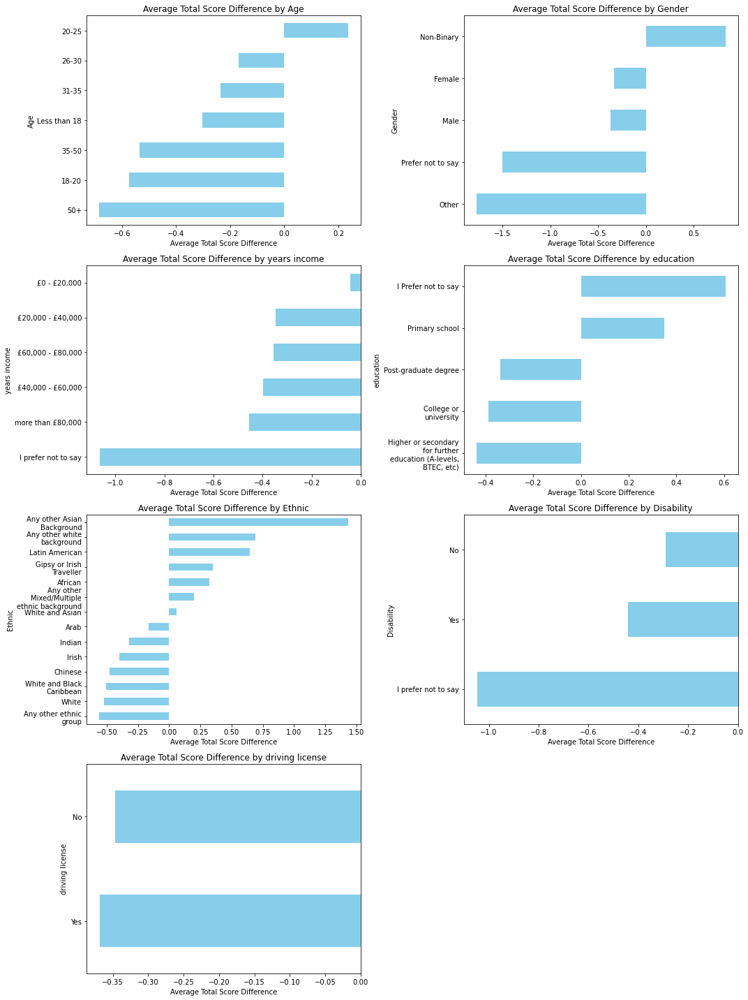

In [37]:
cols_radar_positive = ['Riding e-scooters makes people feel free','Riding e-scooters makes people happy','Riding e-scooters makes people feel more independent',
              'Riding an e-scooter is more sustainable than using other modes of transport',
              'A person is safe from crime when using e-scooters',
              'A person is safe from sexual harassment when using e-scooters']

cols_radar_negative = ['Space on the roads should be re-distributed to make room for e-scooters','E-scooters are dangerous for people who use them','E-scooters are dangerous for pedestrians','E-scooters are dangerous for cyclists',
              'E-scooters are dangerous for people driving motor vehicles','Shared e-scooter apps are too difficult to use','Not everybody has the physical and cognitive skills to ride a e-scooter',
              'Shared e-scooters are difficult to find','Shared e-scooters are not available in my neighbourhood',
              'The design of e-scooters is not appropriate for my height or weight','I am not sure about which road rules apply to e-scooters']

# Creating a new column for the average of all the rating columns
nonuser['total_avg_positive'] = nonuser[cols_radar_positive].mean(axis=1)
nonuser['total_avg_negative'] = nonuser[cols_radar_negative].mean(axis=1)

# Creating dataframes for each of the demographic groups
cols_demographic = ['Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license']
avg_total_positive_dfs = {col: nonuser.groupby(col)['total_avg_positive'].mean() for col in cols_demographic}
avg_total_negative_dfs = {col: nonuser.groupby(col)['total_avg_negative'].mean() for col in cols_demographic}

# Calculate the difference between the positive and negative average total scores for each demographic group
diff_avg_total_dfs = {}

for group in avg_total_positive_dfs.keys():
    diff_avg_total_dfs[group] = avg_total_positive_dfs[group] - avg_total_negative_dfs[group]

# Plotting the bar charts
fig, axs = plt.subplots(4, 2, figsize=(15, 20))
axs = axs.ravel()

for i, (group, df) in enumerate(diff_avg_total_dfs.items()):
    ax = axs[i]
    df.sort_values().plot(kind='barh', ax=ax, color='skyblue')
    ax.set_xlabel('Average Total Score Difference')
    ax.set_title(f'Average Total Score Difference by {group}')
    ax.set_yticklabels([wrap_labels(t.get_text(), 20) for t in ax.get_yticklabels()])

# Removing the last subplot as it is not used
fig.delaxes(axs[-1])

plt.tight_layout()
plt.show()

### 2.6. Individual component and Temporal component

#### 2.6.1. "weekday or weekend" and individual component

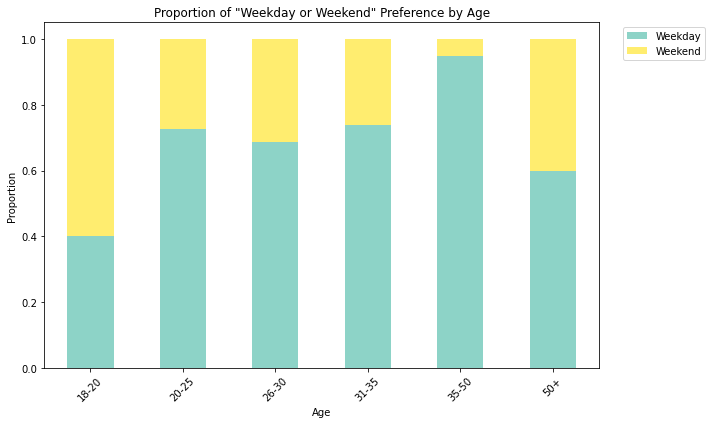

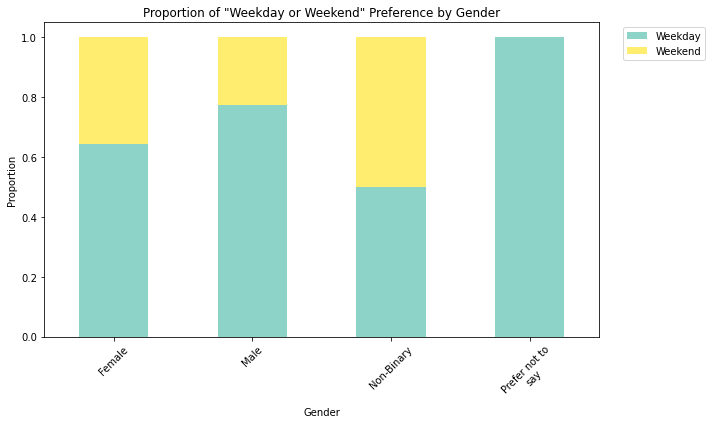

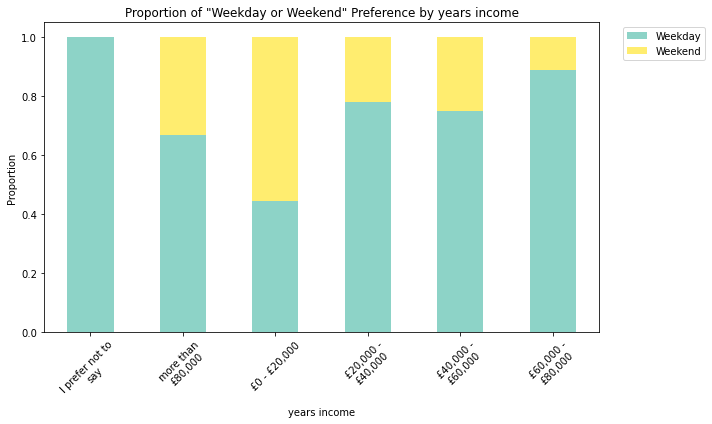

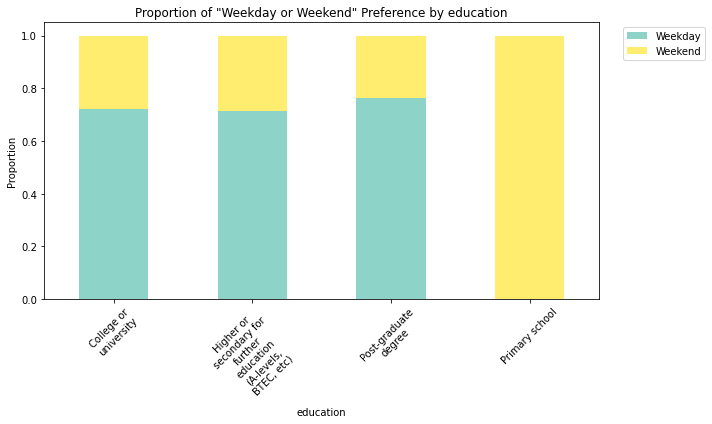

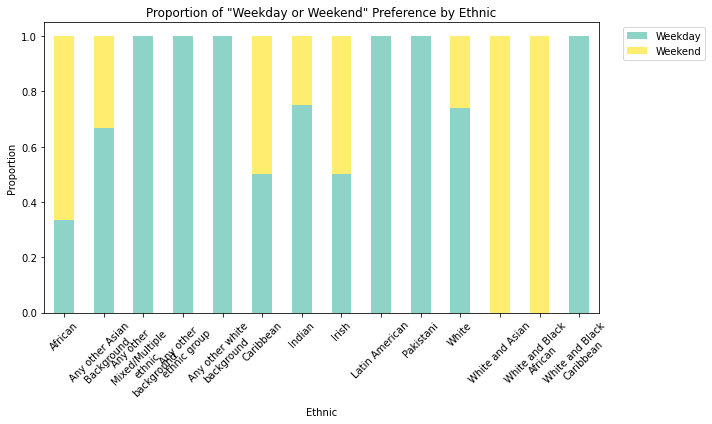

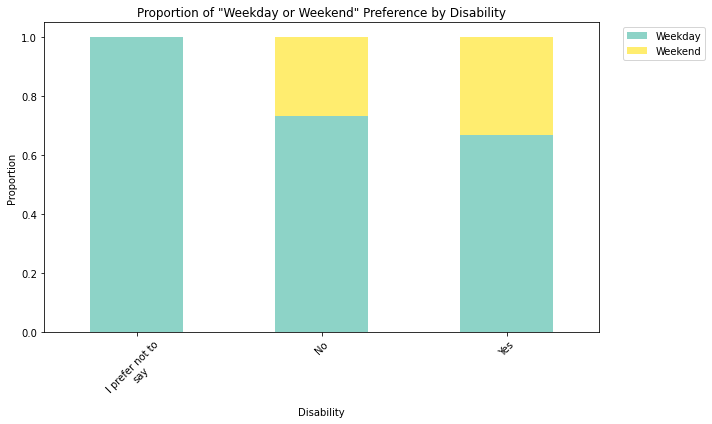

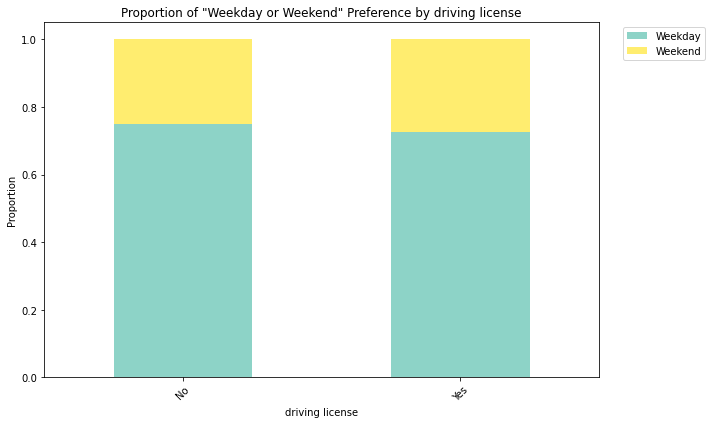

In [38]:
individual_components = ['Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license']

# For each individual component
for comp in individual_components:
    # Create a grouped data
    grouped = user.groupby([comp, 'weekday or weekend']).size().unstack()
    # Fill NaN values with 0
    grouped = grouped.fillna(0)
    # Normalize grouped data by component
    grouped_percentage = grouped.divide(grouped.sum(axis=1), axis=0)
    
    # Plot
    ax = grouped_percentage.plot(kind='bar', stacked=True, colormap='Set3', figsize=(10, 6))
    ax.set_ylabel('Proportion')
    ax.set_title(f'Proportion of "Weekday or Weekend" Preference by {comp}')
    ax.set_xticklabels([wrap_labels(t.get_text(), 15) for t in ax.get_xticklabels()], rotation=45)
    ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.0))

    # Show the plot
    plt.tight_layout()
    plt.show()

#### 2.6.2. "rain" and individual component

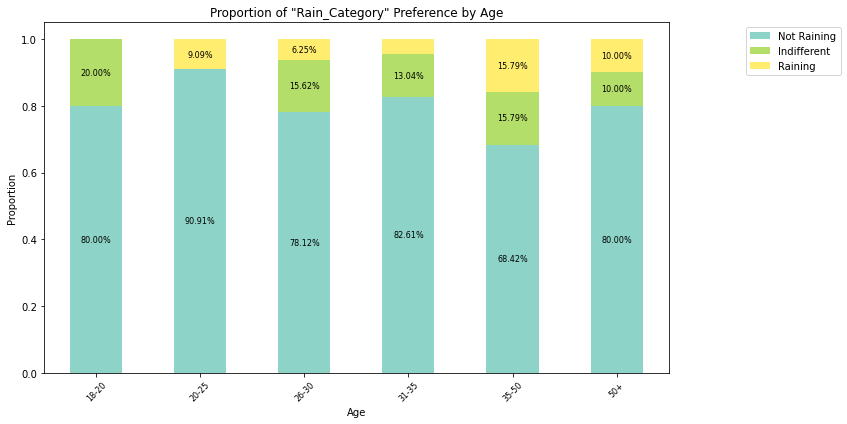

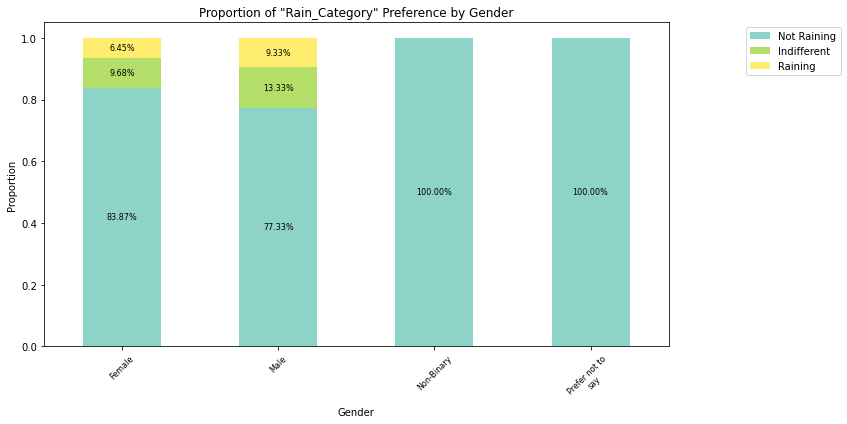

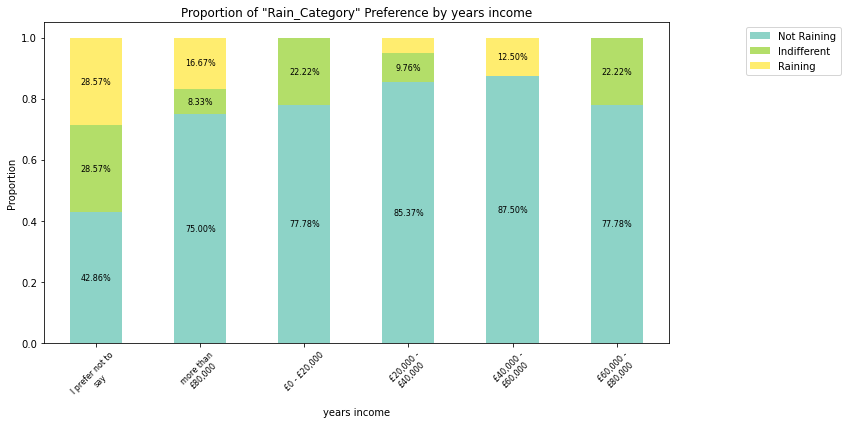

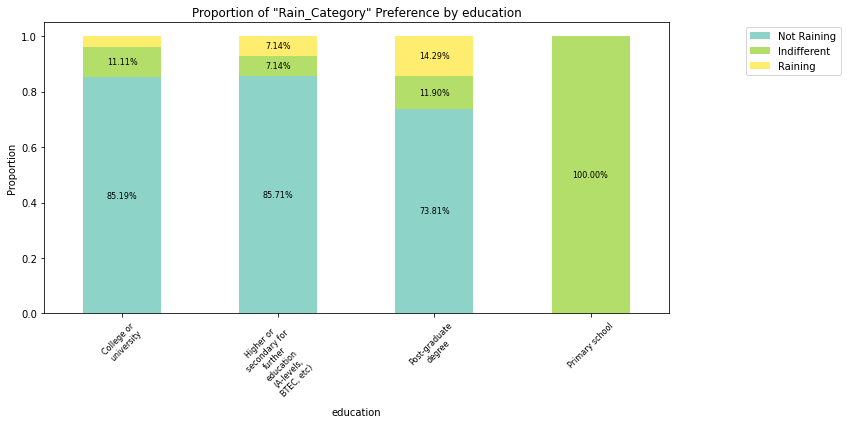

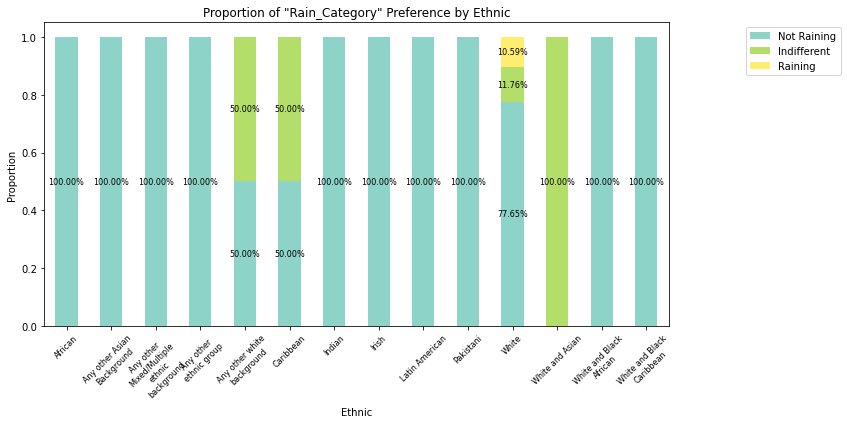

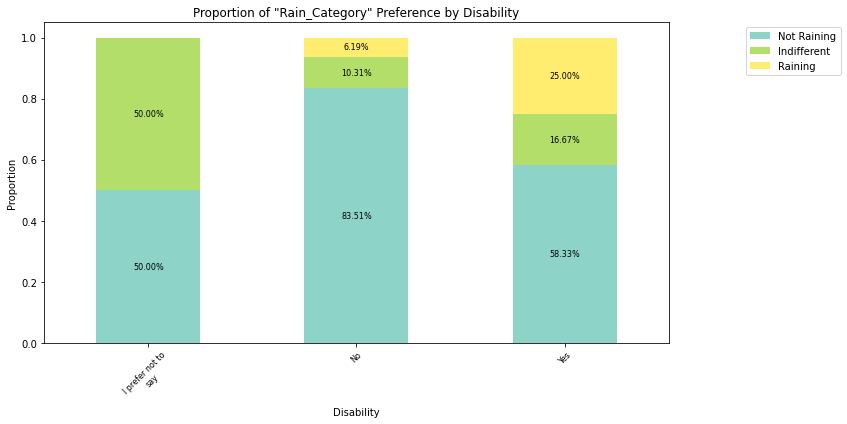

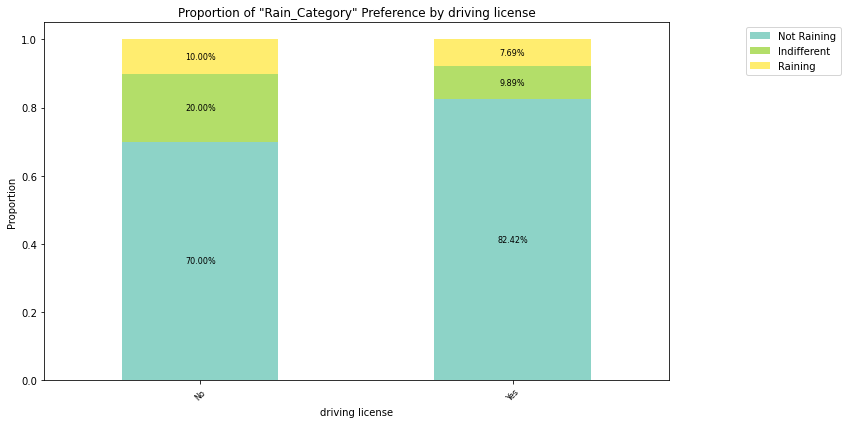

In [41]:
individual_components = ['Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license']

# For each individual component
for comp in individual_components:
    # Create a grouped data
    grouped = user.groupby([comp, 'Rain_Category']).size().unstack()
    # Fill NaN values with 0
    grouped = grouped.fillna(0)
    # Normalize grouped data by component
    grouped_percentage = grouped.divide(grouped.sum(axis=1), axis=0)
    
    # Plot
    ax = grouped_percentage.plot(kind='bar', stacked=True, colormap='Set3', figsize=(12, 6))
    ax.set_ylabel('Proportion')
    ax.set_title(f'Proportion of "Rain_Category" Preference by {comp}')
    ax.set_xticklabels([wrap_labels(t.get_text(), 15) for t in ax.get_xticklabels()], rotation=45, fontsize=8)
    
    # Add annotations for each segment
    for rect in ax.patches:
        # Find where everything is located
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        # The height of the bar is the data value and can be used as the label
        label_text = f'{height:.2%}'  # e.g., '40.00%'

        # ax.text(x, y, text)
        label_x = x + width / 2
        label_y = y + height / 2

        # only plot labels greater than given width and height
        if height > 0.05:
            ax.text(label_x, label_y, label_text, ha='center', va='center', fontsize=8)
    
    ax.legend(loc='upper center', bbox_to_anchor=(1.2, 1.0))

    # Show the plot
    plt.tight_layout()
    plt.show()




#### 2.6.3. "weather" and individual component

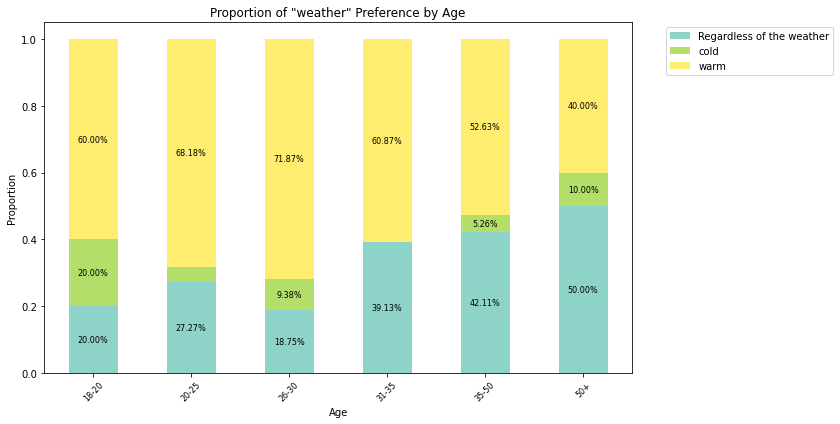

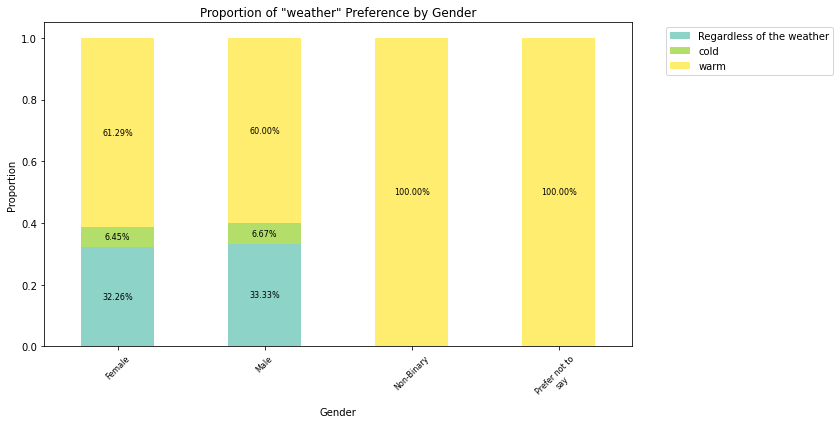

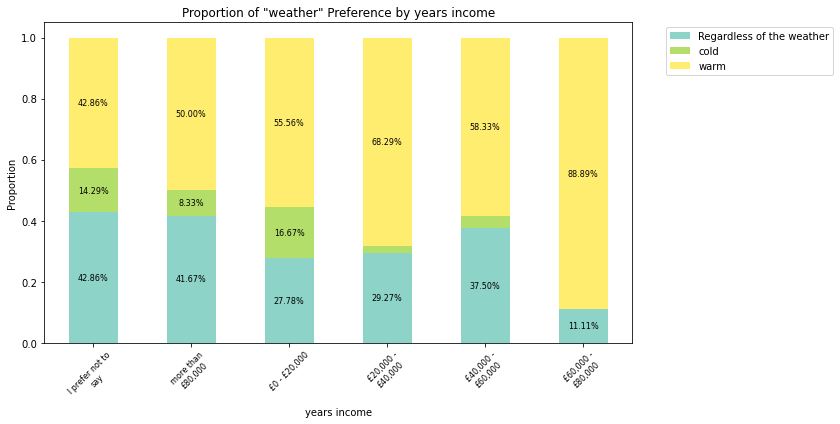

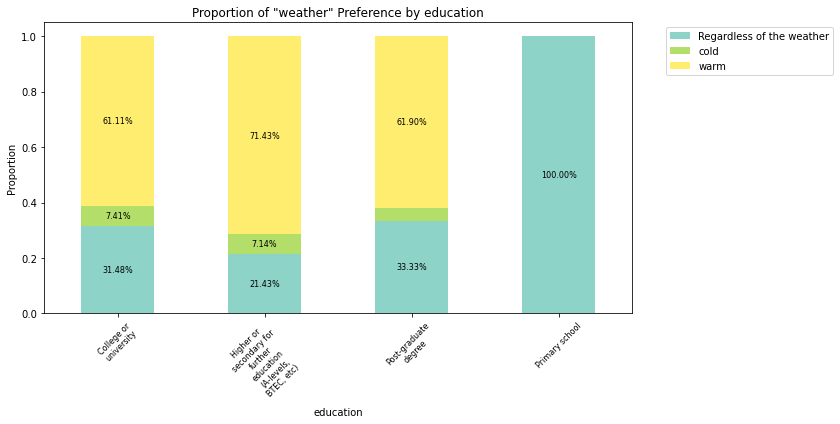

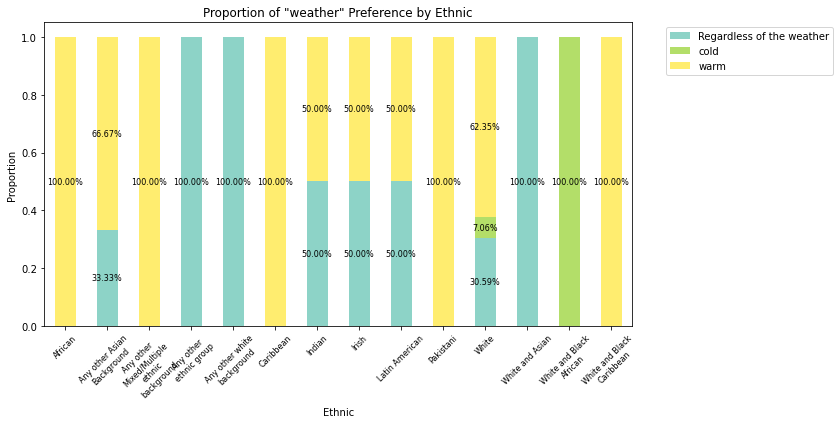

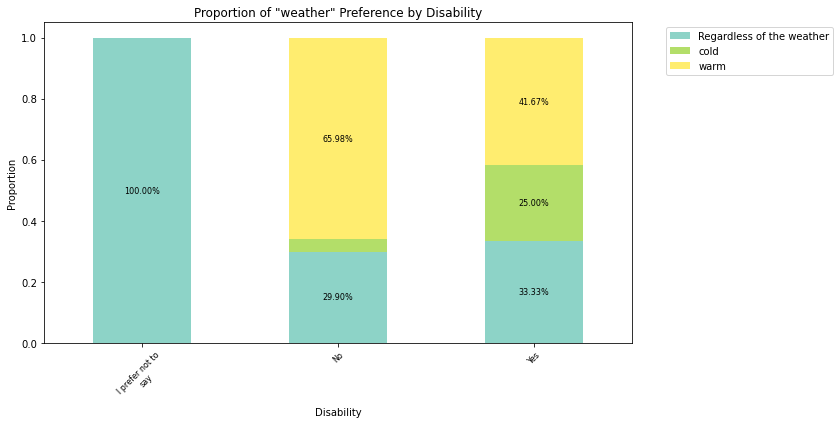

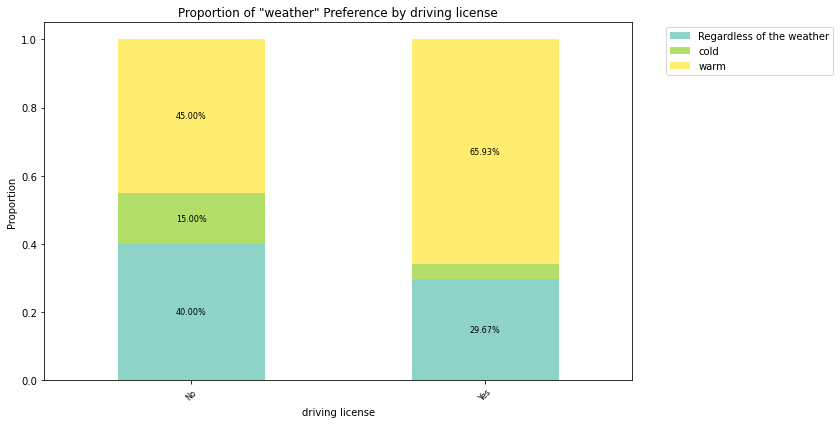

In [42]:
# Create a new column 'weather' based on the conditions provided
conditions = [
    (user['When the weather is too hot'] > user['When the weather is too cold']),
    (user['When the weather is too hot'] < user['When the weather is too cold']),
    (user['When the weather is too hot'] == user['When the weather is too cold'])
]

choices = ['warm', 'cold', 'Regardless of the weather']

user['weather1'] = np.select(conditions, choices, default=np.nan)



# For each individual component
for comp in individual_components:
    # Create a grouped data
    grouped = user.groupby([comp, 'weather1']).size().unstack()
    # Fill NaN values with 0
    grouped = grouped.fillna(0)
    # Normalize grouped data by component
    grouped_percentage = grouped.divide(grouped.sum(axis=1), axis=0)
    
    # Plot
    ax = grouped_percentage.plot(kind='bar', stacked=True, colormap='Set3', figsize=(12, 6))
    ax.set_ylabel('Proportion')
    ax.set_title(f'Proportion of "weather" Preference by {comp}')
    ax.set_xticklabels([wrap_labels(t.get_text(), 15) for t in ax.get_xticklabels()], rotation=45, fontsize=8)
    
    # Add annotations for each segment
    for rect in ax.patches:
        # Find where everything is located
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        # The height of the bar is the data value and can be used as the label
        label_text = f'{height:.2%}'  # e.g., '40.00%'

        # ax.text(x, y, text)
        label_x = x + width / 2
        label_y = y + height / 2

        # only plot labels greater than given width and height
        if height > 0.05:
            ax.text(label_x, label_y, label_text, ha='center', va='center', fontsize=8)
    
    ax.legend(loc='upper center', bbox_to_anchor=(1.2, 1.0))

    # Show the plot
    plt.tight_layout()
    plt.show()


#### 2.6.4. "weather" and land-use component

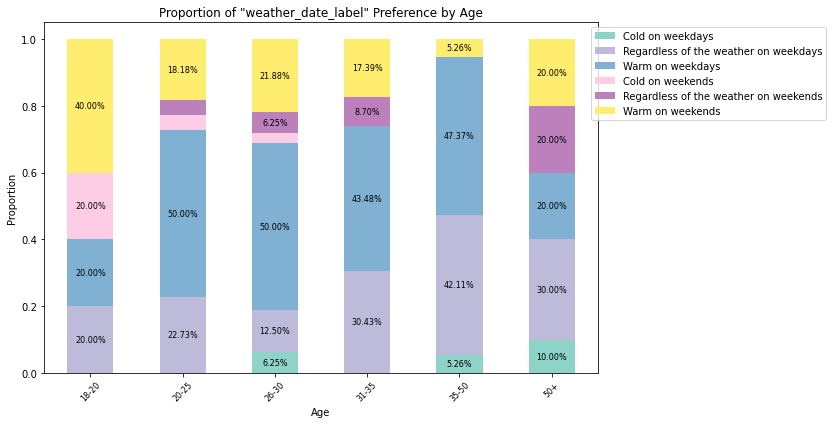

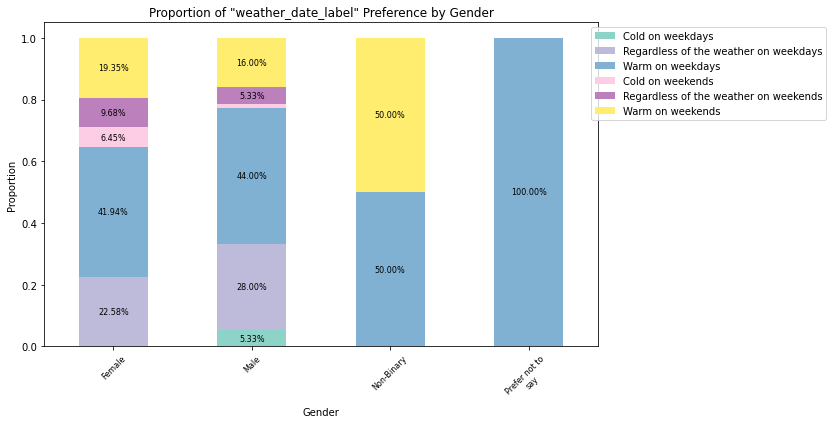

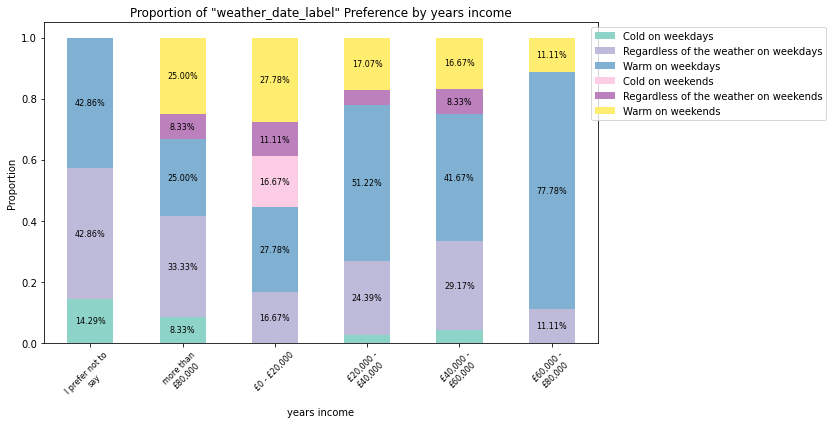

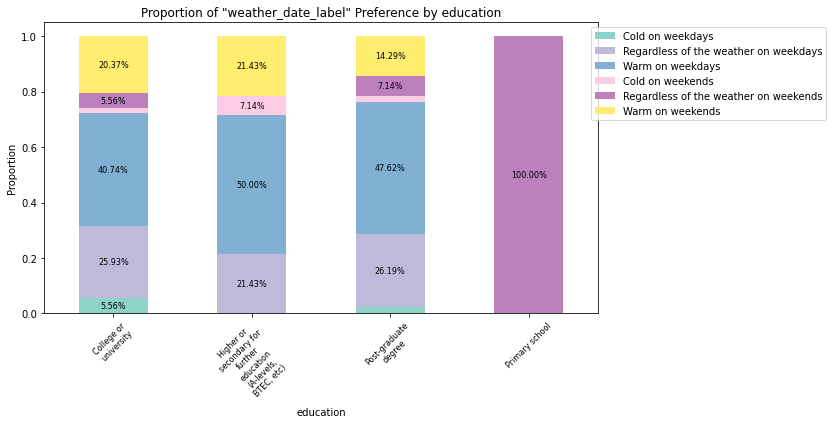

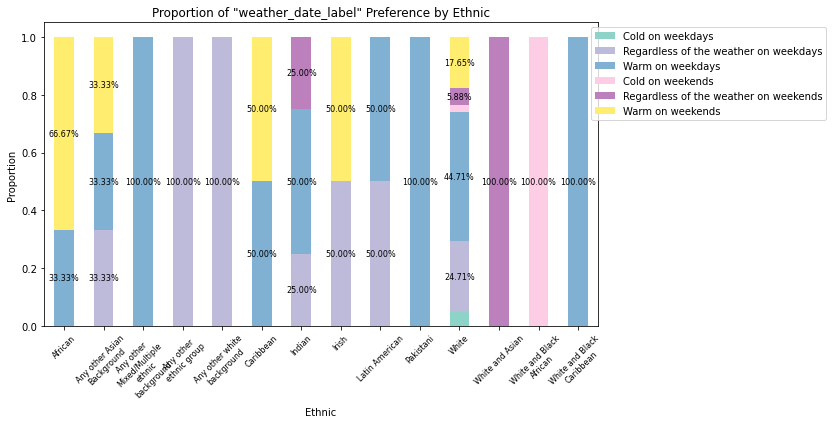

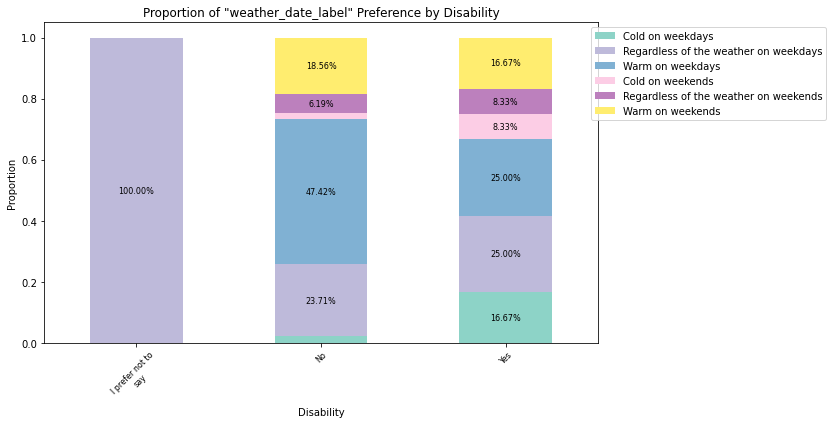

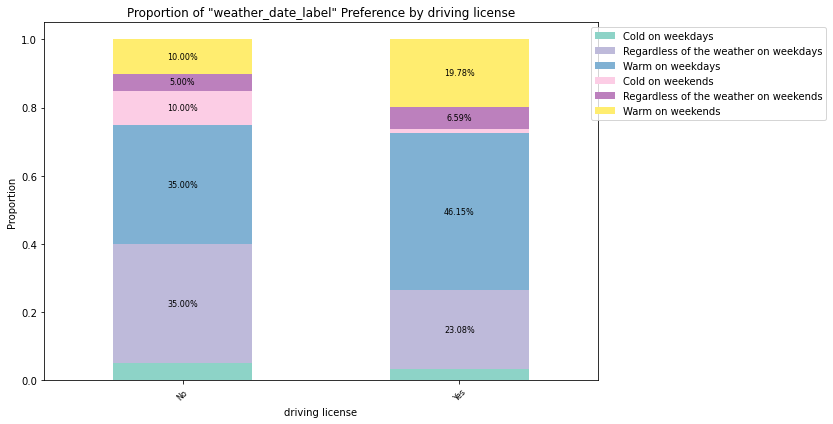

In [43]:
individual_components = ['Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license']

# For each individual component
for comp in individual_components:
    # Create a grouped data
    grouped = user.groupby([comp, 'weather_date_label']).size().unstack()
    # Fill NaN values with 0
    grouped = grouped.fillna(0)
    # Normalize grouped data by component
    grouped_percentage = grouped.divide(grouped.sum(axis=1), axis=0)
    
    # Plot
    ax = grouped_percentage.plot(kind='bar', stacked=True, colormap='Set3', figsize=(12, 6))
    ax.set_ylabel('Proportion')
    ax.set_title(f'Proportion of "weather_date_label" Preference by {comp}')
    ax.set_xticklabels([wrap_labels(t.get_text(), 15) for t in ax.get_xticklabels()], rotation=45, fontsize=8)
    
    # Add annotations for each segment
    for rect in ax.patches:
        # Find where everything is located
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        # The height of the bar is the data value and can be used as the label
        label_text = f'{height:.2%}'  # e.g., '40.00%'

        # ax.text(x, y, text)
        label_x = x + width / 2
        label_y = y + height / 2

        # only plot labels greater than given width and height
        if height > 0.05:
            ax.text(label_x, label_y, label_text, ha='center', va='center', fontsize=8)
    
    ax.legend(loc='upper center', bbox_to_anchor=(1.2, 1.0))

    # Show the plot
    plt.tight_layout()
    plt.show()




### 2.7 Temporal component and individual component

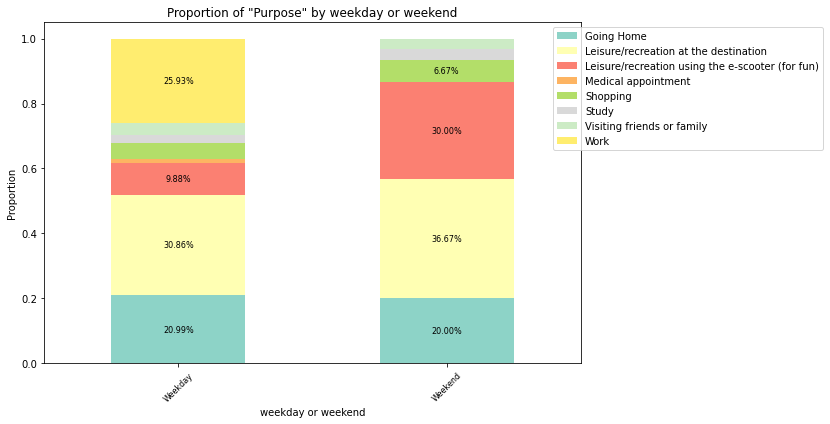

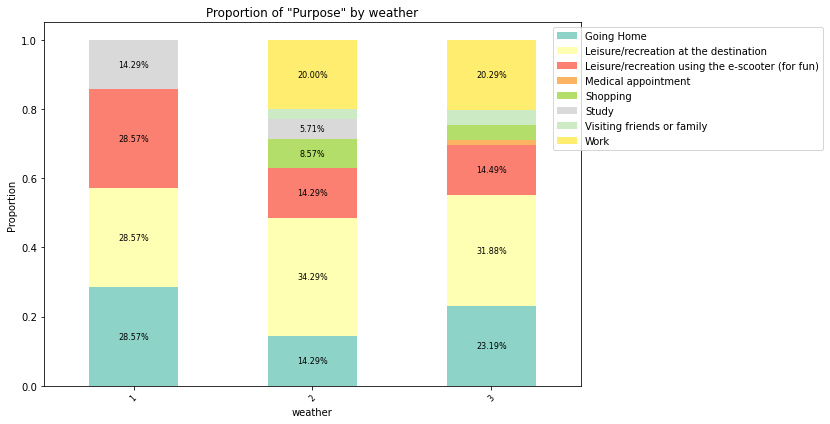

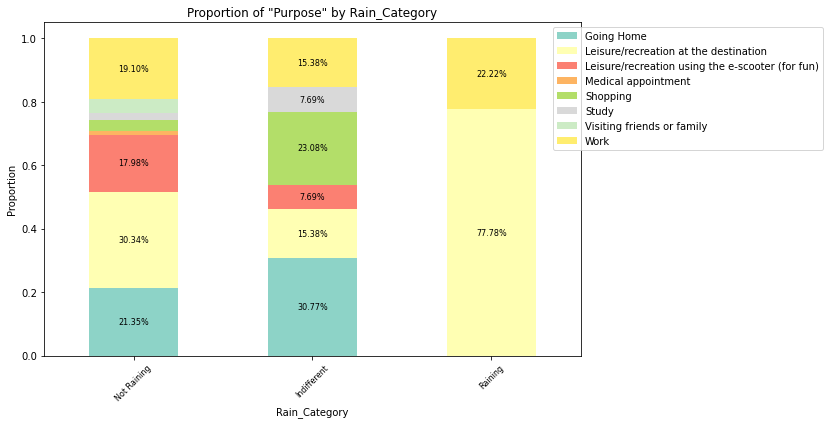

In [44]:
# Define the individual components for the new analysis
individual_components_temporal = ['weekday or weekend', 'weather', 'Rain_Category']

# For each individual component
for comp in individual_components_temporal:
    # Create a grouped data
    grouped = user.groupby([comp, 'Purpose']).size().unstack()
    # Fill NaN values with 0
    grouped = grouped.fillna(0)
    # Normalize grouped data by component
    grouped_percentage = grouped.divide(grouped.sum(axis=1), axis=0)
    
    # Plot
    ax = grouped_percentage.plot(kind='bar', stacked=True, colormap='Set3', figsize=(12, 6))
    ax.set_ylabel('Proportion')
    ax.set_title(f'Proportion of "Purpose" by {comp}')
    ax.set_xticklabels([wrap_labels(t.get_text(), 15) for t in ax.get_xticklabels()], rotation=45, fontsize=8)
    
    # Add annotations for each segment
    for rect in ax.patches:
        # Find where everything is located
        height = rect.get_height()
        width = rect.get_width()
        x = rect.get_x()
        y = rect.get_y()

        # The height of the bar is the data value and can be used as the label
        label_text = f'{height:.2%}'  # e.g., '40.00%'

        # ax.text(x, y, text)
        label_x = x + width / 2
        label_y = y + height / 2

        # only plot labels greater than given width and height
        if height > 0.05:
            ax.text(label_x, label_y, label_text, ha='center', va='center', fontsize=8)
    
    ax.legend(loc='upper center', bbox_to_anchor=(1.2, 1.0))

    # Show the plot
    plt.tight_layout()
    plt.show()


### 2.8. Transport component and individual component

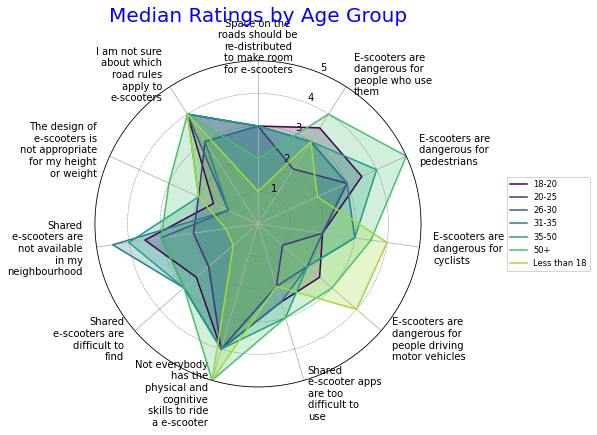

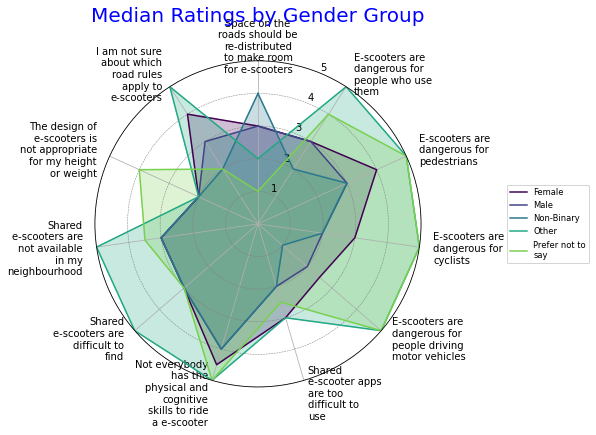

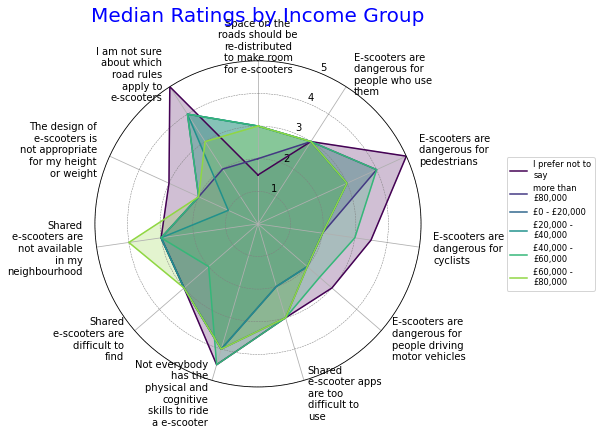

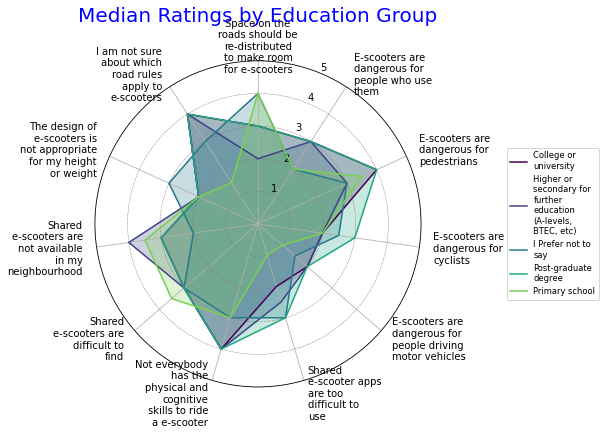

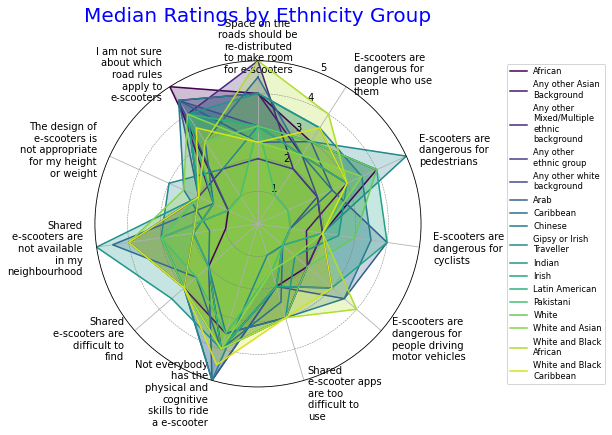

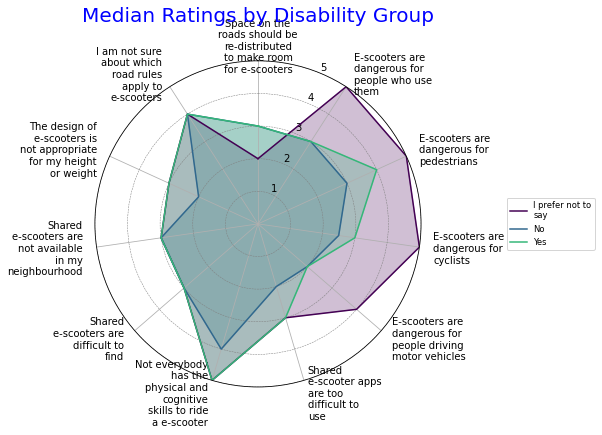

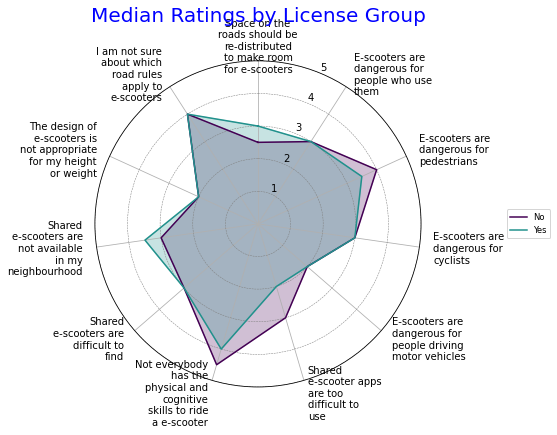

In [45]:
cols_radar = ['Space on the roads should be re-distributed to make room for e-scooters','E-scooters are dangerous for people who use them','E-scooters are dangerous for pedestrians','E-scooters are dangerous for cyclists',
              'E-scooters are dangerous for people driving motor vehicles','Shared e-scooter apps are too difficult to use','Not everybody has the physical and cognitive skills to ride a e-scooter',
              'Shared e-scooters are difficult to find','Shared e-scooters are not available in my neighbourhood',
              'The design of e-scooters is not appropriate for my height or weight','I am not sure about which road rules apply to e-scooters']

# Calculate the mean values for each age group for each of the columns
age_medians = mix.groupby('Age')[cols_radar].median()
age_means = mix.groupby('Age')[cols_radar].mean()
gender_medians = mix.groupby('Gender')[cols_radar].median()
gender_means = mix.groupby('Gender')[cols_radar].mean()
income_medians = mix.groupby('years income')[cols_radar].median()
income_means = mix.groupby('years income')[cols_radar].mean()
edu_medians = mix.groupby('education')[cols_radar].median()
edu_means = mix.groupby('education')[cols_radar].mean()
eth_medians = mix.groupby('Ethnic')[cols_radar].median()
eth_means = mix.groupby('Ethnic')[cols_radar].mean()
dis_medians = mix.groupby('Disability')[cols_radar].median()
dis_means = mix.groupby('Disability')[cols_radar].mean()
lic_medians = mix.groupby('driving license')[cols_radar].median()
lic_means = mix.groupby('driving license')[cols_radar].mean()

# Columns to be analyzed
cols_to_analyze = ['Age', 'Gender', 'years income', 'education', 'Ethnic', 'Disability', 'driving license']

# Store the dataframe names and dataframes in a dictionary
dfs = {'age': age_medians, 'gender': gender_medians, 'income': income_medians, 'education': edu_medians, 'ethnicity': eth_medians, 'disability': dis_medians, 'license': lic_medians}

# Loop through the dictionary to create a radar chart for each dataframe
for df_name, df in dfs.items():
    fig, ax = create_radar_chart(df, f'Median Ratings by {df_name.capitalize()} Group', df.columns)
    plt.show()